In [1]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, Conv1D, MaxPooling1D, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot
    
# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for temperatures
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for temperatures
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for temperatures
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    agg.columns = names

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)

    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    #diff_values_training = np.array(diff_values_for_training)
    #diff_values_training = diff_values_training.reshape(1, -1) 
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (temperatures) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)

    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 3
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')

print(df)
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})
    
#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)

#Since the NaN values of GHI are gone which is used in data preparation, simulate these in solar activity instead
df['solar_activity'].loc[df['Year'] > 2020] = np.nan
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)

#Test model and accuracy when solar activity is removed as a predictor
df_trimmed = df_trimmed.drop(['GHI'], axis=1)

n_vars = df_trimmed.shape[1]-1

X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['temperatures'].iloc[j])
    y.append(add_to_y)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df)
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['temperatures']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df) 

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['temperatures']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + n_vars*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
print("Finished")

Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 3
C:\Users\User
C:\Users\User\Modeling\
             date  file_id  temperatures          slp  vapor_pressure  \
0      2006-01-31     6501     12.209677  1018.534543        8.674922   
1      2006-02-28     6501      8.174541  1021.230347        6.942276   
2      2006-03-31     6501     15.676613  1018.968548       10.468176   
3      2006-04-30     6501     22.464167  1014.686944       16.358802   
4      2006-05-31     6501     23.657258  1014.236828       18.798749   
...           ...      ...           ...          ...             ...   
24057  2024-07-31     9858     28.604704  1013.969355       23.769169   
24058  2024-08-31     9858     29.114919  1015.112097       23.699154   
24059  2024-09-30     9858     24.570278  1014.393750       16.790240   
24060  2024-10-31     9858     21.159140  1018.230376       10.994776   
24061  2024-11-30     9858     12.112917  10

C:\Users\User\AppData\Local\Temp\ipykernel_49264\2008263761.py:375: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['solar_activity'].loc[df['Year'] > 2020] = np.nan


Fold 1
Fold 2
Fold 3
Fold 4
Fold 5
Fold 1:
(84, 1, 1, 1972)
(11, 1, 1, 1972)
(10, 1, 1, 1972)
(84, 1, 1972)
(11, 1, 1972)
(10, 1, 1972)
(84, 1972)
(11, 1972)
(10, 1972)
[[0.39307412 0.69695044 0.32924264 ... 0.45747266 0.31713244 0.95078979]
 [0.45747266 0.51683609 0.42215989 ... 0.5246051  0.60753341 0.55194411]
 [0.38487242 0.62674714 0.3411641  ... 0.4954435  0.36968408 0.88061968]
 ...
 [0.54100851 0.46473952 0.46949509 ... 0.4936209  0.51123937 0.49696233]
 [0.44896719 0.51620076 0.3997195  ... 0.54009721 0.55103281 0.59629405]
 [0.46780073 0.52414231 0.42356241 ... 0.49696233 0.58961118 0.50880923]]
Fold 2:
(84, 1, 1, 1972)
(11, 1, 1, 1972)
(10, 1, 1, 1972)
(84, 1, 1972)
(11, 1, 1972)
(10, 1, 1972)
(84, 1972)
(11, 1972)
(10, 1972)
[[0.38166311 0.62313675 0.34639831 ... 0.47852574 0.40268048 0.84191288]
 [0.39415169 0.71548931 0.32450565 ... 0.45872677 0.31800183 0.95339628]
 [0.45872677 0.53175632 0.4180791  ... 0.52604325 0.6091989  0.5534572 ]
 ...
 [0.54249162 0.47861309 0.465

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

3
179
(84, 1972)
(11, 1972)


In [3]:
n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit an LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    filters = trial.suggest_categorical('filters', [256, 512, 1024]) # Used for CNN-LSTM model
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM Only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model

# make forecast with the CNN-LSTM best model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # invert first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # propagate difference forecast using inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create array from forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test):
    # plot the entire dataset in blue
    plt.plot(series.values)
    # plot the forecasts in red
    for i in range(len(forecasts)):
        off_s = len(series) - n_test + i - 1
        off_e = off_s + len(forecasts[i]) + 1
        xaxis = [x for x in range(off_s, off_e)]
        yaxis = [series.values[off_s]] + forecasts[i]
        plt.plot(xaxis, yaxis, color='red')
    # show the plot
    plt.show()
    
def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "CNN-LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

n_batch = 1
nb_epoch = 100

# optimize and fit model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)

rmse_avg_list = []
mae_avg_list = []
mape_avg_list = []
r2_score_avg_list = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (temperatures)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    #print("Forecasts:")
    #print(forecasts)
    #print("Actual:")
    #print(actual)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction
    
    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    print(np.mean(rmse_list))
    print(np.std(rmse_list))

    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual S.H.\tPredicted S.H.\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = [forecasts[j]]
        
        plot_forecasts(series_ws, forecasts_ws, n_test+2, n_seq)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    # Plotting the results
    plt.figure(figsize=(15, 6))
    plt.plot(results_df['ws'], results_df['Actual'], label='Actual')
    plt.plot(results_df['ws'], results_df['Predicted'], label='Predicted', alpha=0.7)
    plt.title('CNN-LSTM Model Comparison Temperature Prediction')
    plt.xlabel('Weather Station')
    plt.ylabel('Temperature')
    plt.legend()
    plt.show()

    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('CNN-LSTM Training and Validation Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

    # Plot training & validation accuracy
    #plt.subplot(1, 2, 2)
    #plt.plot(history.history['accuracy'], label='Training Accuracy')
    #plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    #plt.title('Model Accuracy')
    #plt.xlabel('Epoch')
    #plt.ylabel('Accuracy')
    #plt.legend(['Training', 'Validation'])
    #plt.tight_layout()

# Plot model architecture
filename = "cnnlstm_model_optimized.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)

[I 2025-05-22 01:46:23,563] A new study created in memory with name: no-name-a6e8c0d9-899b-46c1-a9d0-c62958975c99
[I 2025-05-22 01:55:54,885] Trial 0 finished with value: 0.07917294278740883 and parameters: {'lr': 0.014710268040216816, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.2469385714998809}. Best is trial 0 with value: 0.07917294278740883.


Cross Validation Accuracies:
[0.06003011763095856, 0.0549999438226223, 0.09327070415019989, 0.10939879715442657, 0.07816515117883682]
Mean Cross Validation Accuracy:
0.07917294278740883
Standard Deviation of Cross Validation Accuracy:
0.020318200833275936


[I 2025-05-22 02:05:31,714] Trial 1 finished with value: 0.7402491450309754 and parameters: {'lr': 0.18959181885105397, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.47351451051377835}. Best is trial 0 with value: 0.07917294278740883.


Cross Validation Accuracies:
[0.6416755318641663, 0.5672164559364319, 1.2277337312698364, 0.597221314907074, 0.6673986911773682]
Mean Cross Validation Accuracy:
0.7402491450309754
Standard Deviation of Cross Validation Accuracy:
0.24619603544539476


[I 2025-05-22 02:16:31,156] Trial 2 finished with value: 0.17635319530963897 and parameters: {'lr': 0.031363767060540636, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.16478778252519943}. Best is trial 0 with value: 0.07917294278740883.


Cross Validation Accuracies:
[0.16799968481063843, 0.1714019775390625, 0.14357176423072815, 0.20860648155212402, 0.19018606841564178]
Mean Cross Validation Accuracy:
0.17635319530963897
Standard Deviation of Cross Validation Accuracy:
0.021911370429329228


[I 2025-05-22 02:25:04,084] Trial 3 finished with value: 0.09113806933164596 and parameters: {'lr': 0.0021200909302185145, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.23995171877262644}. Best is trial 0 with value: 0.07917294278740883.


Cross Validation Accuracies:
[0.06269162148237228, 0.09062312543392181, 0.09661763161420822, 0.12338472157716751, 0.08237324655056]
Mean Cross Validation Accuracy:
0.09113806933164596
Standard Deviation of Cross Validation Accuracy:
0.019779584751430816


[I 2025-05-22 02:34:53,814] Trial 4 finished with value: 0.08444069921970368 and parameters: {'lr': 0.5383251263280582, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.3409794974447701}. Best is trial 0 with value: 0.07917294278740883.


Cross Validation Accuracies:
[0.06344917416572571, 0.1003251001238823, 0.08125218003988266, 0.09849406033754349, 0.07868298143148422]
Mean Cross Validation Accuracy:
0.08444069921970368
Standard Deviation of Cross Validation Accuracy:
0.013665820455235992


[I 2025-05-22 02:41:34,435] Trial 5 finished with value: 0.08844920247793198 and parameters: {'lr': 0.06242422301947847, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.15730640900753112}. Best is trial 0 with value: 0.07917294278740883.


Cross Validation Accuracies:
[0.07373131066560745, 0.06480186432600021, 0.08279027789831161, 0.11044595390558243, 0.11047660559415817]
Mean Cross Validation Accuracy:
0.08844920247793198
Standard Deviation of Cross Validation Accuracy:
0.018851524765299502


[I 2025-05-22 02:54:48,851] Trial 6 finished with value: 0.0829933799803257 and parameters: {'lr': 0.0636097982710176, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.23351633995207535}. Best is trial 0 with value: 0.07917294278740883.


Cross Validation Accuracies:
[0.06833726912736893, 0.05881447717547417, 0.09670137614011765, 0.1072504073381424, 0.08386337012052536]
Mean Cross Validation Accuracy:
0.0829933799803257
Standard Deviation of Cross Validation Accuracy:
0.01775663450082474


[I 2025-05-22 03:02:07,270] Trial 7 finished with value: 1.6115389704704284 and parameters: {'lr': 0.17981678581807256, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.42694304654329196}. Best is trial 0 with value: 0.07917294278740883.


Cross Validation Accuracies:
[0.9512825608253479, 1.318684697151184, 1.6899493932724, 1.8720303773880005, 2.22574782371521]
Mean Cross Validation Accuracy:
1.6115389704704284
Standard Deviation of Cross Validation Accuracy:
0.4411255228990734


[I 2025-05-22 03:10:59,353] Trial 8 finished with value: 0.12643343806266785 and parameters: {'lr': 0.004868839849828935, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.24043995794520046}. Best is trial 0 with value: 0.07917294278740883.


Cross Validation Accuracies:
[0.13099604845046997, 0.15106715261936188, 0.1326247602701187, 0.09753158688545227, 0.1199476420879364]
Mean Cross Validation Accuracy:
0.12643343806266785
Standard Deviation of Cross Validation Accuracy:
0.017569020052261273


[I 2025-05-22 03:24:58,348] Trial 9 finished with value: 57.69942398071289 and parameters: {'lr': 0.712723524419364, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.3545141237706426}. Best is trial 0 with value: 0.07917294278740883.


Cross Validation Accuracies:
[49.896175384521484, 53.546695709228516, 72.49537658691406, 57.609840393066406, 54.949031829833984]
Mean Cross Validation Accuracy:
57.69942398071289
Standard Deviation of Cross Validation Accuracy:
7.805494686161691


[I 2025-05-22 03:33:01,329] Trial 10 finished with value: 0.08045378103852271 and parameters: {'lr': 0.009091949618801092, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.10751966986644451}. Best is trial 0 with value: 0.07917294278740883.


Cross Validation Accuracies:
[0.06053940951824188, 0.05601588264107704, 0.09394855052232742, 0.10944532603025436, 0.08231973648071289]
Mean Cross Validation Accuracy:
0.08045378103852271
Standard Deviation of Cross Validation Accuracy:
0.020099220608135612


[I 2025-05-22 03:40:50,192] Trial 11 finished with value: 0.07976110577583313 and parameters: {'lr': 0.010971312776397263, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.12891789911463858}. Best is trial 0 with value: 0.07917294278740883.


Cross Validation Accuracies:
[0.060486968606710434, 0.05709075555205345, 0.09447412937879562, 0.1063317358493805, 0.08042193949222565]
Mean Cross Validation Accuracy:
0.07976110577583313
Standard Deviation of Cross Validation Accuracy:
0.019017598639840604


[I 2025-05-22 03:48:03,341] Trial 12 finished with value: 0.08037619218230248 and parameters: {'lr': 0.013439201852194212, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.10528901731424029}. Best is trial 0 with value: 0.07917294278740883.


Cross Validation Accuracies:
[0.0604466050863266, 0.05778181925415993, 0.09603521227836609, 0.10608483105897903, 0.08153249323368073]
Mean Cross Validation Accuracy:
0.08037619218230248
Standard Deviation of Cross Validation Accuracy:
0.019053452103037796


[I 2025-05-22 03:55:03,661] Trial 13 finished with value: 0.34639292359352114 and parameters: {'lr': 0.001026753887830668, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.28777112062778876}. Best is trial 0 with value: 0.07917294278740883.


Cross Validation Accuracies:
[0.36588236689567566, 0.3491002321243286, 0.3316775858402252, 0.31600046157836914, 0.36930397152900696]
Mean Cross Validation Accuracy:
0.34639292359352114
Standard Deviation of Cross Validation Accuracy:
0.020259945457710593


[I 2025-05-22 04:02:32,047] Trial 14 finished with value: 0.07901186645030975 and parameters: {'lr': 0.01656639762318833, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.16837999218809482}. Best is trial 14 with value: 0.07901186645030975.


Cross Validation Accuracies:
[0.0592428483068943, 0.05711836740374565, 0.09087126702070236, 0.10573268681764603, 0.08209416270256042]
Mean Cross Validation Accuracy:
0.07901186645030975
Standard Deviation of Cross Validation Accuracy:
0.01862411099642457


[I 2025-05-22 04:10:19,198] Trial 15 finished with value: 0.0799357146024704 and parameters: {'lr': 0.030021545990797975, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.19078576214426451}. Best is trial 14 with value: 0.07901186645030975.


Cross Validation Accuracies:
[0.058995556086301804, 0.05580266937613487, 0.09787876158952713, 0.10755132883787155, 0.07945025712251663]
Mean Cross Validation Accuracy:
0.0799357146024704
Standard Deviation of Cross Validation Accuracy:
0.02052171953965692


[I 2025-05-22 04:19:48,724] Trial 16 finished with value: 0.08088571801781655 and parameters: {'lr': 0.003398941111129824, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.294379955571551}. Best is trial 14 with value: 0.07901186645030975.


Cross Validation Accuracies:
[0.061214104294776917, 0.05627148225903511, 0.09460100531578064, 0.11104476451873779, 0.08129723370075226]
Mean Cross Validation Accuracy:
0.08088571801781655
Standard Deviation of Cross Validation Accuracy:
0.0204483716961771


[I 2025-05-22 04:26:57,074] Trial 17 finished with value: 0.07956990152597428 and parameters: {'lr': 0.01865407762923081, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.2008637374127635}. Best is trial 14 with value: 0.07901186645030975.


Cross Validation Accuracies:
[0.059788044542074203, 0.05607130751013756, 0.09694112092256546, 0.10517875850200653, 0.07987027615308762]
Mean Cross Validation Accuracy:
0.07956990152597428
Standard Deviation of Cross Validation Accuracy:
0.019499583740749896


[I 2025-05-22 04:37:11,087] Trial 18 finished with value: 4.45430736541748 and parameters: {'lr': 0.07462006367488375, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.375973662474951}. Best is trial 14 with value: 0.07901186645030975.


Cross Validation Accuracies:
[5.886132717132568, 7.7982072830200195, 2.4927968978881836, 1.4704375267028809, 4.62396240234375]
Mean Cross Validation Accuracy:
4.45430736541748
Standard Deviation of Cross Validation Accuracy:
2.2808584286153515


[I 2025-05-22 04:44:38,500] Trial 19 finished with value: 0.0859145998954773 and parameters: {'lr': 0.005864170286235537, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.2647945792749971}. Best is trial 14 with value: 0.07901186645030975.


Cross Validation Accuracies:
[0.06824216991662979, 0.07216451317071915, 0.08468841016292572, 0.12340659648180008, 0.08107130974531174]
Mean Cross Validation Accuracy:
0.0859145998954773
Standard Deviation of Cross Validation Accuracy:
0.01965701134487836


[I 2025-05-22 04:52:15,730] Trial 20 finished with value: 0.13498821407556533 and parameters: {'lr': 0.0019767863559109833, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.19979871583036024}. Best is trial 14 with value: 0.07901186645030975.


Cross Validation Accuracies:
[0.09034305810928345, 0.2009880691766739, 0.0899798795580864, 0.1448119729757309, 0.14881809055805206]
Mean Cross Validation Accuracy:
0.13498821407556533
Standard Deviation of Cross Validation Accuracy:
0.041623773791206554


[I 2025-05-22 04:58:34,570] Trial 21 finished with value: 0.08020906075835228 and parameters: {'lr': 0.011938537289068633, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.2019066026878535}. Best is trial 14 with value: 0.07901186645030975.


Cross Validation Accuracies:
[0.060854338109493256, 0.05697732791304588, 0.09381485730409622, 0.10879811644554138, 0.08060066401958466]
Mean Cross Validation Accuracy:
0.08020906075835228
Standard Deviation of Cross Validation Accuracy:
0.019580213776430173


[I 2025-05-22 05:05:15,521] Trial 22 finished with value: 0.07953231260180474 and parameters: {'lr': 0.019280843620597617, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.1526925193484659}. Best is trial 14 with value: 0.07901186645030975.


Cross Validation Accuracies:
[0.059056755155324936, 0.05725507438182831, 0.09301094710826874, 0.10961990803480148, 0.0787188783288002]
Mean Cross Validation Accuracy:
0.07953231260180474
Standard Deviation of Cross Validation Accuracy:
0.020015606200506145


[I 2025-05-22 05:11:23,430] Trial 23 finished with value: 0.07927803918719292 and parameters: {'lr': 0.019565103755676407, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.15831922439062263}. Best is trial 14 with value: 0.07901186645030975.


Cross Validation Accuracies:
[0.060546956956386566, 0.055579815059900284, 0.09327740967273712, 0.10559476166963577, 0.08139125257730484]
Mean Cross Validation Accuracy:
0.07927803918719292
Standard Deviation of Cross Validation Accuracy:
0.019002511388583415


[I 2025-05-22 05:17:09,121] Trial 24 finished with value: 0.07650261670351029 and parameters: {'lr': 0.04324183216326839, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.1652741475739628}. Best is trial 24 with value: 0.07650261670351029.


Cross Validation Accuracies:
[0.060845814645290375, 0.05694298446178436, 0.08407238870859146, 0.10666883736848831, 0.07398305833339691]
Mean Cross Validation Accuracy:
0.07650261670351029
Standard Deviation of Cross Validation Accuracy:
0.017896173646449173


[I 2025-05-22 05:24:47,055] Trial 25 finished with value: 0.09160110652446747 and parameters: {'lr': 0.12205323190729626, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.31631492338053196}. Best is trial 24 with value: 0.07650261670351029.


Cross Validation Accuracies:
[0.06087439879775047, 0.05805135890841484, 0.10239514708518982, 0.15232843160629272, 0.08435619622468948]
Mean Cross Validation Accuracy:
0.09160110652446747
Standard Deviation of Cross Validation Accuracy:
0.03442825636391117


[I 2025-05-22 05:31:33,595] Trial 26 finished with value: 0.0814670667052269 and parameters: {'lr': 0.052517512484754364, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.2670667215309369}. Best is trial 24 with value: 0.07650261670351029.


Cross Validation Accuracies:
[0.06504721194505692, 0.05216233432292938, 0.09569466859102249, 0.10999523848295212, 0.08443588018417358]
Mean Cross Validation Accuracy:
0.0814670667052269
Standard Deviation of Cross Validation Accuracy:
0.020753188016379657


[I 2025-05-22 05:40:38,805] Trial 27 finished with value: 0.07515825778245926 and parameters: {'lr': 0.04232401762619373, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.21984846237667394}. Best is trial 27 with value: 0.07515825778245926.


Cross Validation Accuracies:
[0.05757864937186241, 0.053779829293489456, 0.08931844681501389, 0.09836044907569885, 0.07675391435623169]
Mean Cross Validation Accuracy:
0.07515825778245926
Standard Deviation of Cross Validation Accuracy:
0.017363632054815663


[I 2025-05-22 05:46:52,975] Trial 28 finished with value: 2.7350922584533692 and parameters: {'lr': 0.11919047807446774, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.13395941200476236}. Best is trial 27 with value: 0.07515825778245926.


Cross Validation Accuracies:
[2.8642029762268066, 2.499798536300659, 2.334080219268799, 3.469834327697754, 2.507545232772827]
Mean Cross Validation Accuracy:
2.7350922584533692
Standard Deviation of Cross Validation Accuracy:
0.406070665257415


[I 2025-05-22 05:54:33,549] Trial 29 finished with value: 3.03670220375061 and parameters: {'lr': 0.2962817275497089, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.21863165613326246}. Best is trial 27 with value: 0.07515825778245926.


Cross Validation Accuracies:
[1.9496684074401855, 2.347752332687378, 1.4975167512893677, 1.7061928510665894, 7.682380676269531]
Mean Cross Validation Accuracy:
3.03670220375061
Standard Deviation of Cross Validation Accuracy:
2.339998712129253


[I 2025-05-22 05:59:40,012] Trial 30 finished with value: 0.07882719859480858 and parameters: {'lr': 0.03597139518476745, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.18523180166959696}. Best is trial 27 with value: 0.07515825778245926.


Cross Validation Accuracies:
[0.06038428843021393, 0.05563754960894585, 0.09910361468791962, 0.10215891152620316, 0.07685162872076035]
Mean Cross Validation Accuracy:
0.07882719859480858
Standard Deviation of Cross Validation Accuracy:
0.019169274945328826


[I 2025-05-22 06:07:21,157] Trial 31 finished with value: 0.07495713829994202 and parameters: {'lr': 0.039708556394055024, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.16972047034274895}. Best is trial 31 with value: 0.07495713829994202.


Cross Validation Accuracies:
[0.05806669220328331, 0.0544649101793766, 0.08506155014038086, 0.09993519634008408, 0.07725734263658524]
Mean Cross Validation Accuracy:
0.07495713829994202
Standard Deviation of Cross Validation Accuracy:
0.016949997314322167


[I 2025-05-22 06:14:12,416] Trial 32 finished with value: 0.0773834154009819 and parameters: {'lr': 0.04194201114231639, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.18190222515184512}. Best is trial 31 with value: 0.07495713829994202.


Cross Validation Accuracies:
[0.056393709033727646, 0.05290421470999718, 0.09587431699037552, 0.1020597293972969, 0.07968510687351227]
Mean Cross Validation Accuracy:
0.0773834154009819
Standard Deviation of Cross Validation Accuracy:
0.019979643327753132


[I 2025-05-22 06:20:47,083] Trial 33 finished with value: 0.07895019426941871 and parameters: {'lr': 0.03461480574434174, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.12801933498890805}. Best is trial 31 with value: 0.07495713829994202.


Cross Validation Accuracies:
[0.05934859812259674, 0.05700795724987984, 0.09327438473701477, 0.10474448651075363, 0.0803755447268486]
Mean Cross Validation Accuracy:
0.07895019426941871
Standard Deviation of Cross Validation Accuracy:
0.018645342075889006


[I 2025-05-22 06:29:34,547] Trial 34 finished with value: 0.08003450334072112 and parameters: {'lr': 0.09957329567798301, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.22238823045687323}. Best is trial 31 with value: 0.07495713829994202.


Cross Validation Accuracies:
[0.06626040488481522, 0.0703492984175682, 0.0891118198633194, 0.0989379957318306, 0.07551299780607224]
Mean Cross Validation Accuracy:
0.08003450334072112
Standard Deviation of Cross Validation Accuracy:
0.012196005041065577


[I 2025-05-22 06:37:20,899] Trial 35 finished with value: 0.18687749803066253 and parameters: {'lr': 0.04768828872508071, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.25947163634868037}. Best is trial 31 with value: 0.07495713829994202.


Cross Validation Accuracies:
[0.16595861315727234, 0.1679091900587082, 0.21253405511379242, 0.20267215371131897, 0.18531347811222076]
Mean Cross Validation Accuracy:
0.18687749803066253
Standard Deviation of Cross Validation Accuracy:
0.018480111901180346


[I 2025-05-22 06:48:29,034] Trial 36 finished with value: 0.08025008291006089 and parameters: {'lr': 0.025581585092411353, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.4840036483533296}. Best is trial 31 with value: 0.07495713829994202.


Cross Validation Accuracies:
[0.059963785111904144, 0.06185247004032135, 0.09284090250730515, 0.1052626445889473, 0.08133061230182648]
Mean Cross Validation Accuracy:
0.08025008291006089
Standard Deviation of Cross Validation Accuracy:
0.01752330197934865


[I 2025-05-22 06:55:39,875] Trial 37 finished with value: 0.08681008294224739 and parameters: {'lr': 0.25369878384023165, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.17762506771761416}. Best is trial 31 with value: 0.07495713829994202.


Cross Validation Accuracies:
[0.06721733510494232, 0.059523846954107285, 0.11878175288438797, 0.10890083760023117, 0.0796266421675682]
Mean Cross Validation Accuracy:
0.08681008294224739
Standard Deviation of Cross Validation Accuracy:
0.023195712465145044


[I 2025-05-22 07:07:08,395] Trial 38 finished with value: 0.08072173967957497 and parameters: {'lr': 0.0838003813589338, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.21966284975181483}. Best is trial 31 with value: 0.07495713829994202.


Cross Validation Accuracies:
[0.0536685548722744, 0.05371788889169693, 0.07788482308387756, 0.13440623879432678, 0.08393119275569916]
Mean Cross Validation Accuracy:
0.08072173967957497
Standard Deviation of Cross Validation Accuracy:
0.02953457937947488


[I 2025-05-22 07:14:24,889] Trial 39 finished with value: 1.104731261730194 and parameters: {'lr': 0.044529555841941716, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.13248990797449062}. Best is trial 31 with value: 0.07495713829994202.


Cross Validation Accuracies:
[0.9588524103164673, 1.3891328573226929, 1.0954184532165527, 0.8617567420005798, 1.2184958457946777]
Mean Cross Validation Accuracy:
1.104731261730194
Standard Deviation of Cross Validation Accuracy:
0.1866711724358964


[I 2025-05-22 07:22:23,428] Trial 40 finished with value: 0.10979643911123275 and parameters: {'lr': 0.14031091146717997, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.14751100743188764}. Best is trial 31 with value: 0.07495713829994202.


Cross Validation Accuracies:
[0.0747232586145401, 0.1184861958026886, 0.11571463942527771, 0.12666985392570496, 0.11338824778795242]
Mean Cross Validation Accuracy:
0.10979643911123275
Standard Deviation of Cross Validation Accuracy:
0.01810126058338951


[I 2025-05-22 07:28:48,161] Trial 41 finished with value: 0.0775991901755333 and parameters: {'lr': 0.03815594385975825, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.18698692087125718}. Best is trial 31 with value: 0.07495713829994202.


Cross Validation Accuracies:
[0.0591251477599144, 0.05439801514148712, 0.09430789947509766, 0.10415374487638474, 0.07601114362478256]
Mean Cross Validation Accuracy:
0.0775991901755333
Standard Deviation of Cross Validation Accuracy:
0.01932062110699211


[I 2025-05-22 07:34:25,154] Trial 42 finished with value: 0.07932386621832847 and parameters: {'lr': 0.02624409714653282, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.17084048483766462}. Best is trial 31 with value: 0.07495713829994202.


Cross Validation Accuracies:
[0.05911121517419815, 0.057435568422079086, 0.09095203131437302, 0.10832693427801132, 0.0807935819029808]
Mean Cross Validation Accuracy:
0.07932386621832847
Standard Deviation of Cross Validation Accuracy:
0.019319425908749233


[I 2025-05-22 07:42:04,569] Trial 43 finished with value: 0.07691581547260284 and parameters: {'lr': 0.06567124055327891, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.24126369584830304}. Best is trial 31 with value: 0.07495713829994202.


Cross Validation Accuracies:
[0.05715605989098549, 0.056485239416360855, 0.0919034406542778, 0.10478376597166061, 0.07425057142972946]
Mean Cross Validation Accuracy:
0.07691581547260284
Standard Deviation of Cross Validation Accuracy:
0.019058916433247353


[I 2025-05-22 07:49:20,220] Trial 44 finished with value: 0.07478532567620277 and parameters: {'lr': 0.06426892142426924, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.23365022796337748}. Best is trial 44 with value: 0.07478532567620277.


Cross Validation Accuracies:
[0.05800866708159447, 0.05113011598587036, 0.0830032080411911, 0.10659868270158768, 0.07518595457077026]
Mean Cross Validation Accuracy:
0.07478532567620277
Standard Deviation of Cross Validation Accuracy:
0.019600045910120704


[I 2025-05-22 07:57:09,439] Trial 45 finished with value: 0.08012527674436569 and parameters: {'lr': 0.06883065712117904, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.24026710866465575}. Best is trial 44 with value: 0.07478532567620277.


Cross Validation Accuracies:
[0.06054804474115372, 0.057496167719364166, 0.09374275803565979, 0.10751919448375702, 0.08132021874189377]
Mean Cross Validation Accuracy:
0.08012527674436569
Standard Deviation of Cross Validation Accuracy:
0.019144894882875345


[I 2025-05-22 08:03:52,465] Trial 46 finished with value: 0.08090164586901664 and parameters: {'lr': 0.061698008061905, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.25290535031866035}. Best is trial 44 with value: 0.07478532567620277.


Cross Validation Accuracies:
[0.06756336987018585, 0.051348377019166946, 0.10061066597700119, 0.10352620482444763, 0.08145961165428162]
Mean Cross Validation Accuracy:
0.08090164586901664
Standard Deviation of Cross Validation Accuracy:
0.019758202214243684


[I 2025-05-22 08:12:31,871] Trial 47 finished with value: 0.08034973442554474 and parameters: {'lr': 0.16194844774932984, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.21806398723315543}. Best is trial 44 with value: 0.07478532567620277.


Cross Validation Accuracies:
[0.08342745900154114, 0.07968901097774506, 0.08084779232740402, 0.08434780687093735, 0.07343660295009613]
Mean Cross Validation Accuracy:
0.08034973442554474
Standard Deviation of Cross Validation Accuracy:
0.0038453342062612678


[I 2025-05-22 08:23:44,249] Trial 48 finished with value: 7.598497295379639 and parameters: {'lr': 0.08929850576212543, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.2826000968755183}. Best is trial 44 with value: 0.07478532567620277.


Cross Validation Accuracies:
[9.244102478027344, 7.587616443634033, 6.427145481109619, 7.006680011749268, 7.72694206237793]
Mean Cross Validation Accuracy:
7.598497295379639
Standard Deviation of Cross Validation Accuracy:
0.9430742959341261


[I 2025-05-22 08:33:00,770] Trial 49 finished with value: 0.08076599091291428 and parameters: {'lr': 0.3120069630701862, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.4567366536764276}. Best is trial 44 with value: 0.07478532567620277.


Cross Validation Accuracies:
[0.06289827823638916, 0.07269182801246643, 0.08609610795974731, 0.0979168713092804, 0.08422686904668808]
Mean Cross Validation Accuracy:
0.08076599091291428
Standard Deviation of Cross Validation Accuracy:
0.011991561919900627


[I 2025-05-22 08:39:48,734] Trial 50 finished with value: 0.08018983826041222 and parameters: {'lr': 0.024408013414358627, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.23468138148738865}. Best is trial 44 with value: 0.07478532567620277.


Cross Validation Accuracies:
[0.059588924050331116, 0.058355774730443954, 0.09372121840715408, 0.10783180594444275, 0.08145146816968918]
Mean Cross Validation Accuracy:
0.08018983826041222
Standard Deviation of Cross Validation Accuracy:
0.019234824317733823


[I 2025-05-22 08:46:39,314] Trial 51 finished with value: 0.07761984467506408 and parameters: {'lr': 0.06275186289977804, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.20494814609382297}. Best is trial 44 with value: 0.07478532567620277.


Cross Validation Accuracies:
[0.05638260766863823, 0.060730304569005966, 0.08370643854141235, 0.11772727221250534, 0.06955260038375854]
Mean Cross Validation Accuracy:
0.07761984467506408
Standard Deviation of Cross Validation Accuracy:
0.022122430244807288


[I 2025-05-22 08:54:54,824] Trial 52 finished with value: 0.079315946996212 and parameters: {'lr': 0.03921494191355071, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.17258632222026488}. Best is trial 44 with value: 0.07478532567620277.


Cross Validation Accuracies:
[0.06173078715801239, 0.056793712079524994, 0.0883115604519844, 0.1064179465174675, 0.08332572877407074]
Mean Cross Validation Accuracy:
0.079315946996212
Standard Deviation of Cross Validation Accuracy:
0.01815492606197733


[I 2025-05-22 09:01:17,710] Trial 53 finished with value: 0.07499116510152817 and parameters: {'lr': 0.04973075390796902, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.3179270594268017}. Best is trial 44 with value: 0.07478532567620277.


Cross Validation Accuracies:
[0.0574352890253067, 0.05432959645986557, 0.09001579880714417, 0.09746759384870529, 0.07570754736661911]
Mean Cross Validation Accuracy:
0.07499116510152817
Standard Deviation of Cross Validation Accuracy:
0.017126306515430463


[I 2025-05-22 09:07:44,205] Trial 54 finished with value: 0.09393567964434624 and parameters: {'lr': 0.19637458400707333, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.31866001136791794}. Best is trial 44 with value: 0.07478532567620277.


Cross Validation Accuracies:
[0.08602572232484818, 0.05583614483475685, 0.07998405396938324, 0.149978905916214, 0.09785357117652893]
Mean Cross Validation Accuracy:
0.09393567964434624
Standard Deviation of Cross Validation Accuracy:
0.031192893169744284


[I 2025-05-22 09:15:19,955] Trial 55 finished with value: 0.08278479576110839 and parameters: {'lr': 0.05504572165650926, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.3862565013178578}. Best is trial 44 with value: 0.07478532567620277.


Cross Validation Accuracies:
[0.059105731546878815, 0.05900092422962189, 0.09975704550743103, 0.1119537428021431, 0.08410653471946716]
Mean Cross Validation Accuracy:
0.08278479576110839
Standard Deviation of Cross Validation Accuracy:
0.021293202454756032


[I 2025-05-22 09:23:02,550] Trial 56 finished with value: 0.10091339945793151 and parameters: {'lr': 0.10966603143009948, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.3143121515790299}. Best is trial 44 with value: 0.07478532567620277.


Cross Validation Accuracies:
[0.07908568531274796, 0.08574319630861282, 0.10707695782184601, 0.1395471692085266, 0.0931139886379242]
Mean Cross Validation Accuracy:
0.10091339945793151
Standard Deviation of Cross Validation Accuracy:
0.021438155678052483


[I 2025-05-22 09:30:58,130] Trial 57 finished with value: 0.08035441562533378 and parameters: {'lr': 0.00870353649108152, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.3360557057443466}. Best is trial 44 with value: 0.07478532567620277.


Cross Validation Accuracies:
[0.061062488704919815, 0.06233270466327667, 0.09337086975574493, 0.10316846519708633, 0.08183754980564117]
Mean Cross Validation Accuracy:
0.08035441562533378
Standard Deviation of Cross Validation Accuracy:
0.016667748097993314


[I 2025-05-22 09:41:18,864] Trial 58 finished with value: 0.07479674741625786 and parameters: {'lr': 0.07714635209801753, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.2818692868855272}. Best is trial 44 with value: 0.07478532567620277.


Cross Validation Accuracies:
[0.05510322004556656, 0.048534344881772995, 0.10494203865528107, 0.0909835547208786, 0.07442057877779007]
Mean Cross Validation Accuracy:
0.07479674741625786
Standard Deviation of Cross Validation Accuracy:
0.021205855911188797


[I 2025-05-22 09:52:03,854] Trial 59 finished with value: 2.185862922668457 and parameters: {'lr': 0.029050816049488074, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.2737909712300476}. Best is trial 44 with value: 0.07478532567620277.


Cross Validation Accuracies:
[2.1570029258728027, 2.158999443054199, 2.202035903930664, 2.2308034896850586, 2.1804728507995605]
Mean Cross Validation Accuracy:
2.185862922668457
Standard Deviation of Cross Validation Accuracy:
0.027802225498920214


[I 2025-05-22 10:01:14,820] Trial 60 finished with value: 0.0739956870675087 and parameters: {'lr': 0.07802023337863838, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.30112980959249014}. Best is trial 60 with value: 0.0739956870675087.


Cross Validation Accuracies:
[0.054670121520757675, 0.05001848563551903, 0.0735216736793518, 0.12198300659656525, 0.06978514790534973]
Mean Cross Validation Accuracy:
0.0739956870675087
Standard Deviation of Cross Validation Accuracy:
0.02556998176191753


[I 2025-05-22 10:09:31,877] Trial 61 finished with value: 0.07110884636640549 and parameters: {'lr': 0.08585053559360793, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.30708502715011304}. Best is trial 61 with value: 0.07110884636640549.


Cross Validation Accuracies:
[0.059112485498189926, 0.061585452407598495, 0.07536254078149796, 0.08764876425266266, 0.0718349888920784]
Mean Cross Validation Accuracy:
0.07110884636640549
Standard Deviation of Cross Validation Accuracy:
0.010264480399940412


[I 2025-05-22 10:18:17,213] Trial 62 finished with value: 0.08892092630267143 and parameters: {'lr': 0.07573815412441842, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3042821913218897}. Best is trial 61 with value: 0.07110884636640549.


Cross Validation Accuracies:
[0.062473978847265244, 0.09328344464302063, 0.09293456375598907, 0.1034509465098381, 0.09246169775724411]
Mean Cross Validation Accuracy:
0.08892092630267143
Standard Deviation of Cross Validation Accuracy:
0.01384370204316578


[I 2025-05-22 10:26:50,424] Trial 63 finished with value: 0.07707638144493104 and parameters: {'lr': 0.20673256966511738, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.33600043361298926}. Best is trial 61 with value: 0.07110884636640549.


Cross Validation Accuracies:
[0.089813232421875, 0.05324824899435043, 0.07634265720844269, 0.09377705305814743, 0.0722007155418396]
Mean Cross Validation Accuracy:
0.07707638144493104
Standard Deviation of Cross Validation Accuracy:
0.014375188141221398


[I 2025-05-22 10:35:28,190] Trial 64 finished with value: 0.0800392597913742 and parameters: {'lr': 0.09123022484469492, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.2973803745515953}. Best is trial 61 with value: 0.07110884636640549.


Cross Validation Accuracies:
[0.06301523745059967, 0.06712143868207932, 0.07946661859750748, 0.09700799733400345, 0.09358500689268112]
Mean Cross Validation Accuracy:
0.0800392597913742
Standard Deviation of Cross Validation Accuracy:
0.013626743375664253


[I 2025-05-22 10:44:32,471] Trial 65 finished with value: 0.07882156893610955 and parameters: {'lr': 0.04982396902940896, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3502263415963505}. Best is trial 61 with value: 0.07110884636640549.


Cross Validation Accuracies:
[0.057254936546087265, 0.06291133165359497, 0.09001381695270538, 0.10323476046323776, 0.08069299906492233]
Mean Cross Validation Accuracy:
0.07882156893610955
Standard Deviation of Cross Validation Accuracy:
0.01698839527421317


[I 2025-05-22 10:55:13,306] Trial 66 finished with value: 0.0804757758975029 and parameters: {'lr': 0.1397306076001149, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.2823789921838596}. Best is trial 61 with value: 0.07110884636640549.


Cross Validation Accuracies:
[0.06563116610050201, 0.06583453714847565, 0.08772878348827362, 0.1130988597869873, 0.07008553296327591]
Mean Cross Validation Accuracy:
0.0804757758975029
Standard Deviation of Cross Validation Accuracy:
0.018218436716335464


[I 2025-05-22 11:05:06,719] Trial 67 finished with value: 0.15963147729635238 and parameters: {'lr': 0.9299421477159896, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3056464965336183}. Best is trial 61 with value: 0.07110884636640549.


Cross Validation Accuracies:
[0.14274701476097107, 0.1694982647895813, 0.12475614994764328, 0.20198005437850952, 0.15917590260505676]
Mean Cross Validation Accuracy:
0.15963147729635238
Standard Deviation of Cross Validation Accuracy:
0.026047405081533956


[I 2025-05-22 11:12:32,194] Trial 68 finished with value: 0.08110724687576294 and parameters: {'lr': 0.021315296297464623, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.32570059735137835}. Best is trial 61 with value: 0.07110884636640549.


Cross Validation Accuracies:
[0.061384569853544235, 0.058560196310281754, 0.0979919359087944, 0.1055995523929596, 0.08199997991323471]
Mean Cross Validation Accuracy:
0.08110724687576294
Standard Deviation of Cross Validation Accuracy:
0.018884470888490296


[I 2025-05-22 11:19:29,144] Trial 69 finished with value: 0.08088472038507462 and parameters: {'lr': 0.03330432137404379, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3826187083418443}. Best is trial 61 with value: 0.07110884636640549.


Cross Validation Accuracies:
[0.05972259119153023, 0.05806246027350426, 0.09298502653837204, 0.11169376969337463, 0.08195975422859192]
Mean Cross Validation Accuracy:
0.08088472038507462
Standard Deviation of Cross Validation Accuracy:
0.020324674140826643


[I 2025-05-22 11:25:17,355] Trial 70 finished with value: 1.8464656591415405 and parameters: {'lr': 0.4149166255256717, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3702703663798381}. Best is trial 61 with value: 0.07110884636640549.


Cross Validation Accuracies:
[2.4068777561187744, 2.1249260902404785, 2.20408034324646, 1.2053788900375366, 1.2910652160644531]
Mean Cross Validation Accuracy:
1.8464656591415405
Standard Deviation of Cross Validation Accuracy:
0.4977855140729034


[I 2025-05-22 11:32:21,794] Trial 71 finished with value: 0.0741151012480259 and parameters: {'lr': 0.056464095284918095, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.27655592988259675}. Best is trial 61 with value: 0.07110884636640549.


Cross Validation Accuracies:
[0.057177916169166565, 0.053367551416158676, 0.0780346691608429, 0.10804608464241028, 0.07394928485155106]
Mean Cross Validation Accuracy:
0.0741151012480259
Standard Deviation of Cross Validation Accuracy:
0.019411497645631888


[I 2025-05-22 11:39:23,548] Trial 72 finished with value: 0.08031304702162742 and parameters: {'lr': 0.014784943390522049, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.27224274302475215}. Best is trial 61 with value: 0.07110884636640549.


Cross Validation Accuracies:
[0.06192648410797119, 0.056866277009248734, 0.09399127960205078, 0.10759402066469193, 0.0811871737241745]
Mean Cross Validation Accuracy:
0.08031304702162742
Standard Deviation of Cross Validation Accuracy:
0.019078398186016875


[I 2025-05-22 11:44:37,342] Trial 73 finished with value: 0.08306900709867478 and parameters: {'lr': 0.07789374479953705, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.25763538812416586}. Best is trial 61 with value: 0.07110884636640549.


Cross Validation Accuracies:
[0.06683670729398727, 0.06445607542991638, 0.11154287308454514, 0.08929038047790527, 0.0832189992070198]
Mean Cross Validation Accuracy:
0.08306900709867478
Standard Deviation of Cross Validation Accuracy:
0.017084600146288445


[I 2025-05-22 11:48:52,219] Trial 74 finished with value: 0.08063774034380913 and parameters: {'lr': 0.05415790488491961, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.2896249010068094}. Best is trial 61 with value: 0.07110884636640549.


Cross Validation Accuracies:
[0.05871528014540672, 0.056544721126556396, 0.0923541709780693, 0.10854699462652206, 0.08702753484249115]
Mean Cross Validation Accuracy:
0.08063774034380913
Standard Deviation of Cross Validation Accuracy:
0.02009028885463519


[I 2025-05-22 11:52:56,530] Trial 75 finished with value: 0.08059147596359253 and parameters: {'lr': 0.0985817556539478, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.349536013316474}. Best is trial 61 with value: 0.07110884636640549.


Cross Validation Accuracies:
[0.08919034898281097, 0.059708371758461, 0.07464591413736343, 0.1079939529299736, 0.07141879200935364]
Mean Cross Validation Accuracy:
0.08059147596359253
Standard Deviation of Cross Validation Accuracy:
0.016615825219891637


[I 2025-05-22 11:57:02,254] Trial 76 finished with value: 0.08308909609913825 and parameters: {'lr': 0.13183282874732108, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.2521854002041104}. Best is trial 61 with value: 0.07110884636640549.


Cross Validation Accuracies:
[0.057282689958810806, 0.09316504746675491, 0.07120946049690247, 0.11472941190004349, 0.07905887067317963]
Mean Cross Validation Accuracy:
0.08308909609913825
Standard Deviation of Cross Validation Accuracy:
0.019626377336885537


[I 2025-05-22 12:02:36,786] Trial 77 finished with value: 4.840043544769287 and parameters: {'lr': 0.05436984660387661, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.2757580557910941}. Best is trial 61 with value: 0.07110884636640549.


Cross Validation Accuracies:
[4.178370475769043, 4.909848213195801, 4.899159908294678, 5.003774166107178, 5.209064960479736]
Mean Cross Validation Accuracy:
4.840043544769287
Standard Deviation of Cross Validation Accuracy:
0.34904532886931444


[I 2025-05-22 12:06:56,722] Trial 78 finished with value: 0.09852827414870262 and parameters: {'lr': 0.1641289856684968, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.32694915853525774}. Best is trial 61 with value: 0.07110884636640549.


Cross Validation Accuracies:
[0.10277080535888672, 0.05684621259570122, 0.12355451285839081, 0.08871112018823624, 0.12075871974229813]
Mean Cross Validation Accuracy:
0.09852827414870262
Standard Deviation of Cross Validation Accuracy:
0.02438144857675684


[I 2025-05-22 12:11:37,123] Trial 79 finished with value: 0.0795481987297535 and parameters: {'lr': 0.031283057131955665, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.22805183585412298}. Best is trial 61 with value: 0.07110884636640549.


Cross Validation Accuracies:
[0.06048593297600746, 0.058361925184726715, 0.09245369583368301, 0.1069229319691658, 0.07951650768518448]
Mean Cross Validation Accuracy:
0.0795481987297535
Standard Deviation of Cross Validation Accuracy:
0.01859116479482641


[I 2025-05-22 12:15:46,669] Trial 80 finished with value: 0.07984748184680938 and parameters: {'lr': 0.044226330449253254, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.36230529408555384}. Best is trial 61 with value: 0.07110884636640549.


Cross Validation Accuracies:
[0.06151476129889488, 0.05413869395852089, 0.10346758365631104, 0.09932312369346619, 0.08079324662685394]
Mean Cross Validation Accuracy:
0.07984748184680938
Standard Deviation of Cross Validation Accuracy:
0.01967300039761389


[I 2025-05-22 12:18:46,003] Trial 81 finished with value: 0.07857580110430717 and parameters: {'lr': 0.07076813527396508, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.14260337893746955}. Best is trial 61 with value: 0.07110884636640549.


Cross Validation Accuracies:
[0.05829017981886864, 0.05651964247226715, 0.0758955180644989, 0.10345842689275742, 0.09871523827314377]
Mean Cross Validation Accuracy:
0.07857580110430717
Standard Deviation of Cross Validation Accuracy:
0.019646406680698638


[I 2025-05-22 12:22:01,846] Trial 82 finished with value: 0.08162688910961151 and parameters: {'lr': 0.03930391576945284, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.30634892174421946}. Best is trial 61 with value: 0.07110884636640549.


Cross Validation Accuracies:
[0.06293105334043503, 0.05498094856739044, 0.10016310960054398, 0.10673720389604568, 0.08332213014364243]
Mean Cross Validation Accuracy:
0.08162688910961151
Standard Deviation of Cross Validation Accuracy:
0.020181841558258955


[I 2025-05-22 12:25:12,561] Trial 83 finished with value: 0.07436145097017288 and parameters: {'lr': 0.08422878059226144, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.15958527280279247}. Best is trial 61 with value: 0.07110884636640549.


Cross Validation Accuracies:
[0.05067842826247215, 0.06124156340956688, 0.10622575879096985, 0.0821966677904129, 0.07146483659744263]
Mean Cross Validation Accuracy:
0.07436145097017288
Standard Deviation of Cross Validation Accuracy:
0.019068991187366966


[I 2025-05-22 12:28:18,477] Trial 84 finished with value: 0.07527140006422997 and parameters: {'lr': 0.11035349242004268, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.2941456868082029}. Best is trial 61 with value: 0.07110884636640549.


Cross Validation Accuracies:
[0.0665033683180809, 0.06230231747031212, 0.07212955504655838, 0.09971069544553757, 0.07571106404066086]
Mean Cross Validation Accuracy:
0.07527140006422997
Standard Deviation of Cross Validation Accuracy:
0.013056945563885777


[I 2025-05-22 12:33:18,649] Trial 85 finished with value: 0.0745856449007988 and parameters: {'lr': 0.06195103334782728, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.11147680831047134}. Best is trial 61 with value: 0.07110884636640549.


Cross Validation Accuracies:
[0.054090842604637146, 0.056599512696266174, 0.09076269716024399, 0.09147345274686813, 0.08000171929597855]
Mean Cross Validation Accuracy:
0.0745856449007988
Standard Deviation of Cross Validation Accuracy:
0.016246641550439783


[I 2025-05-22 12:40:10,201] Trial 86 finished with value: 0.07979127392172813 and parameters: {'lr': 0.08466896189752005, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.10670376320407321}. Best is trial 61 with value: 0.07110884636640549.


Cross Validation Accuracies:
[0.06976234167814255, 0.046199847012758255, 0.08908513933420181, 0.11328887939453125, 0.0806201621890068]
Mean Cross Validation Accuracy:
0.07979127392172813
Standard Deviation of Cross Validation Accuracy:
0.02208219194828028


[I 2025-05-22 12:43:48,002] Trial 87 finished with value: 0.0753684937953949 and parameters: {'lr': 0.06130422005047453, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.11627723596411914}. Best is trial 61 with value: 0.07110884636640549.


Cross Validation Accuracies:
[0.06315269321203232, 0.05073211342096329, 0.08385790139436722, 0.10281026363372803, 0.07628949731588364]
Mean Cross Validation Accuracy:
0.0753684937953949
Standard Deviation of Cross Validation Accuracy:
0.017788457170718613


[I 2025-05-22 12:47:02,765] Trial 88 finished with value: 0.1202573761343956 and parameters: {'lr': 0.08122023597573473, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.12537732089251688}. Best is trial 61 with value: 0.07110884636640549.


Cross Validation Accuracies:
[0.10089178383350372, 0.10038887709379196, 0.16204626858234406, 0.11145719885826111, 0.12650275230407715]
Mean Cross Validation Accuracy:
0.1202573761343956
Standard Deviation of Cross Validation Accuracy:
0.022945774316458594


[I 2025-05-22 12:52:22,208] Trial 89 finished with value: 0.07951183915138245 and parameters: {'lr': 0.10294283738595092, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.11722795185994825}. Best is trial 61 with value: 0.07110884636640549.


Cross Validation Accuracies:
[0.06208670511841774, 0.054618950933218, 0.09177977591753006, 0.10668479651212692, 0.0823889672756195]
Mean Cross Validation Accuracy:
0.07951183915138245
Standard Deviation of Cross Validation Accuracy:
0.01908109499153088


[I 2025-05-22 12:56:20,589] Trial 90 finished with value: 0.07114652171730995 and parameters: {'lr': 0.048239975757370476, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.16281855842022475}. Best is trial 61 with value: 0.07110884636640549.


Cross Validation Accuracies:
[0.05335984379053116, 0.048215772956609726, 0.07809526473283768, 0.09427625685930252, 0.08178547024726868]
Mean Cross Validation Accuracy:
0.07114652171730995
Standard Deviation of Cross Validation Accuracy:
0.01754218944975226


[I 2025-05-22 13:00:11,823] Trial 91 finished with value: 0.07361612394452095 and parameters: {'lr': 0.048250959492265696, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.16095230126090557}. Best is trial 61 with value: 0.07110884636640549.


Cross Validation Accuracies:
[0.06369859725236893, 0.048936959356069565, 0.08095052093267441, 0.10011594742536545, 0.0743785947561264]
Mean Cross Validation Accuracy:
0.07361612394452095
Standard Deviation of Cross Validation Accuracy:
0.017111597739005686


[I 2025-05-22 13:04:09,577] Trial 92 finished with value: 0.06571338921785355 and parameters: {'lr': 0.0713225001068327, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.16079535852270452}. Best is trial 92 with value: 0.06571338921785355.


Cross Validation Accuracies:
[0.047666534781455994, 0.05321182310581207, 0.06995537877082825, 0.08843991160392761, 0.0692932978272438]
Mean Cross Validation Accuracy:
0.06571338921785355
Standard Deviation of Cross Validation Accuracy:
0.014347704702049904


[I 2025-05-22 13:08:02,173] Trial 93 finished with value: 0.07302899584174156 and parameters: {'lr': 0.06074112876142217, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.15992931251797526}. Best is trial 92 with value: 0.06571338921785355.


Cross Validation Accuracies:
[0.06750199943780899, 0.05860995873808861, 0.08120525628328323, 0.09272683411836624, 0.06510093063116074]
Mean Cross Validation Accuracy:
0.07302899584174156
Standard Deviation of Cross Validation Accuracy:
0.012297695766352377


[I 2025-05-22 13:11:44,524] Trial 94 finished with value: 0.07061483934521676 and parameters: {'lr': 0.058797581782365584, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.1564112373636804}. Best is trial 92 with value: 0.06571338921785355.


Cross Validation Accuracies:
[0.060295093804597855, 0.05076299607753754, 0.07600724697113037, 0.09146133065223694, 0.07454752922058105]
Mean Cross Validation Accuracy:
0.07061483934521676
Standard Deviation of Cross Validation Accuracy:
0.013997950840184407


[I 2025-05-22 13:15:31,822] Trial 95 finished with value: 0.07316754832863807 and parameters: {'lr': 0.06435922614102788, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.15169243504312963}. Best is trial 92 with value: 0.06571338921785355.


Cross Validation Accuracies:
[0.052651308476924896, 0.05692654475569725, 0.09597856551408768, 0.08809593319892883, 0.07218538969755173]
Mean Cross Validation Accuracy:
0.07316754832863807
Standard Deviation of Cross Validation Accuracy:
0.01690473371666245


[I 2025-05-22 13:19:16,406] Trial 96 finished with value: 0.0911871261894703 and parameters: {'lr': 0.12159772007529687, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.1556508445500523}. Best is trial 92 with value: 0.06571338921785355.


Cross Validation Accuracies:
[0.04976019635796547, 0.06885919719934464, 0.11491565406322479, 0.13859641551971436, 0.0838041678071022]
Mean Cross Validation Accuracy:
0.0911871261894703
Standard Deviation of Cross Validation Accuracy:
0.03187450000418088


[I 2025-05-22 13:23:30,264] Trial 97 finished with value: 3.568035936355591 and parameters: {'lr': 0.04830546847799214, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.16081569617106578}. Best is trial 92 with value: 0.06571338921785355.


Cross Validation Accuracies:
[3.9009087085723877, 4.014468669891357, 3.2085654735565186, 2.332012891769409, 4.384223937988281]
Mean Cross Validation Accuracy:
3.568035936355591
Standard Deviation of Cross Validation Accuracy:
0.7257053537680083


[I 2025-05-22 13:28:22,315] Trial 98 finished with value: 0.08373225927352905 and parameters: {'lr': 0.09586273931521429, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.1416914166310825}. Best is trial 92 with value: 0.06571338921785355.


Cross Validation Accuracies:
[0.09068857878446579, 0.09099281579256058, 0.09718625992536545, 0.07825391739606857, 0.061539724469184875]
Mean Cross Validation Accuracy:
0.08373225927352905
Standard Deviation of Cross Validation Accuracy:
0.012685716585295994


[I 2025-05-22 13:32:03,449] Trial 99 finished with value: 0.31997133493423463 and parameters: {'lr': 0.0010356304146639564, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.1924283762137921}. Best is trial 92 with value: 0.06571338921785355.


Cross Validation Accuracies:
[0.32406869530677795, 0.3335599899291992, 0.26566994190216064, 0.3155444264411926, 0.36101362109184265]
Mean Cross Validation Accuracy:
0.31997133493423463
Standard Deviation of Cross Validation Accuracy:
0.0311581384670753
Number of finished trials: 100
Best trial: {'lr': 0.0713225001068327, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.16079535852270452}
Best hyperparameters:  {'lr': 0.0713225001068327, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.16079535852270452}
Epoch 1/100
84/84 [==============================] - 19s 85ms/step - loss: 0.1294 - val_loss: 0.0959
Epoch 2/100
84/84 [==============================] - 3s 40ms/step - loss: 0.0943 - val_loss: 0.0944
Epoch 3/100
84/84 [==============================] - 4s 43ms/step - loss: 0.0959 - val_loss: 0.0759
Epoch 4/100
84/84 [==============================] - 2s 28ms/step - loss: 0.08

IndexError: index 10 is out of bounds for axis 0 with size 10

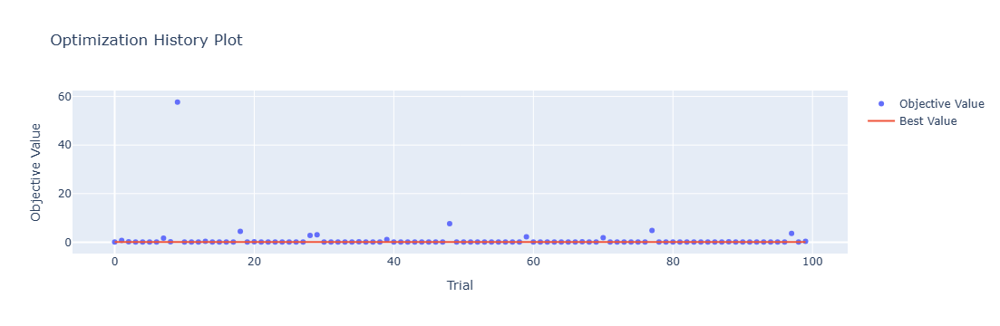

In [4]:
optuna.visualization.plot_optimization_history(study)

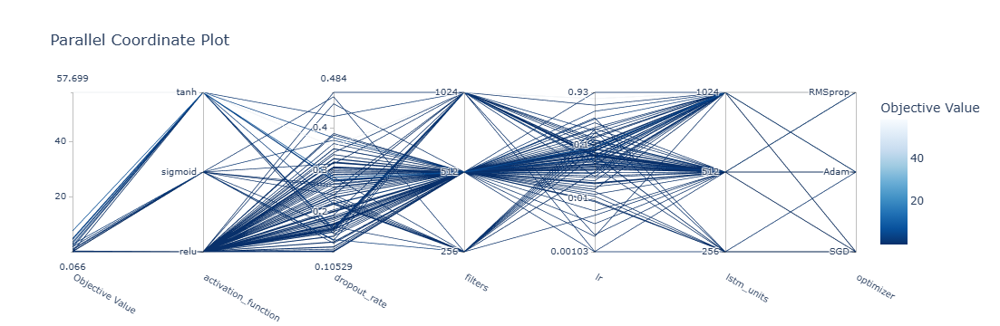

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

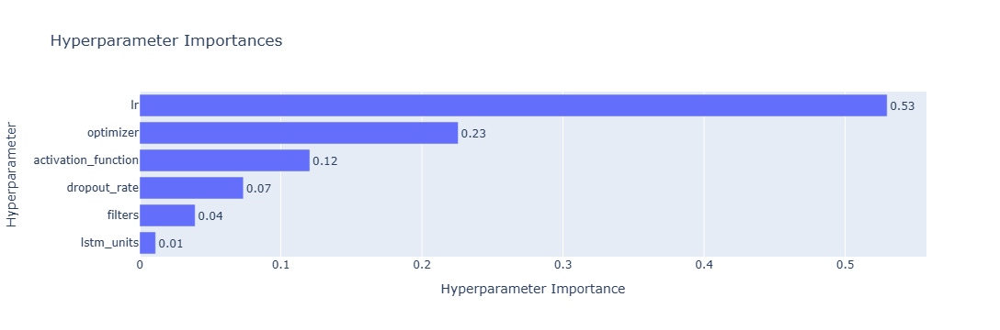

In [6]:
optuna.visualization.plot_param_importances(study)

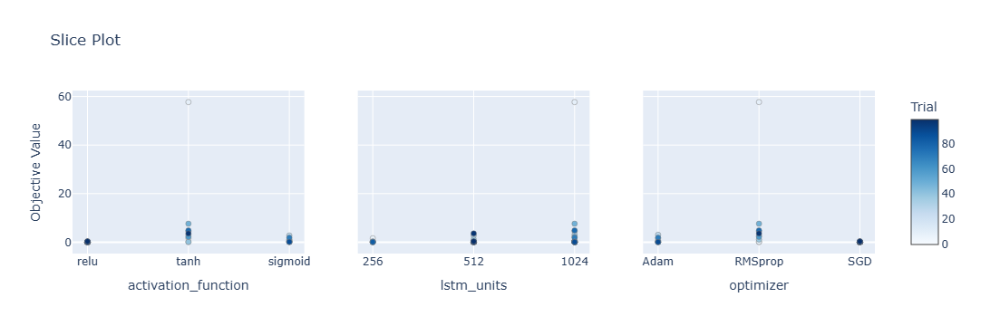

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

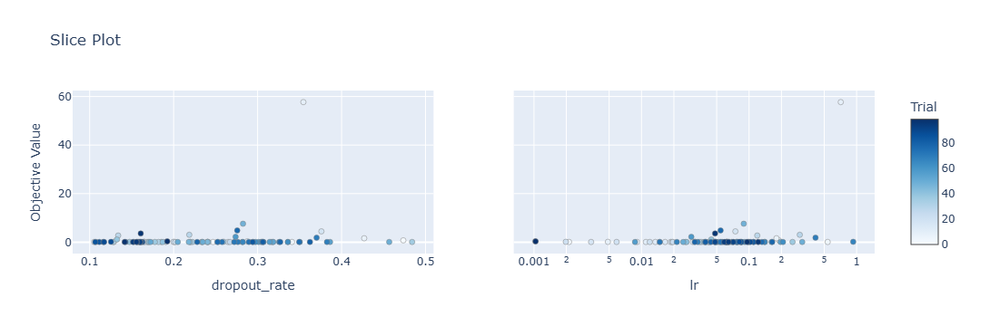

In [8]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate'])

[[12.21  8.17 15.68 ... 23.86 20.59 15.82]
 [14.52 12.85 16.77 ... 26.49 23.17 21.15]
 [ 8.91  6.23 11.39 ... 22.62 16.72 14.05]
 ...
 [ 7.87  5.76 10.62 ... 21.07 15.24 12.04]
 [ 6.49  2.73  9.77 ... 21.93 16.5  11.44]
 [ 5.29  1.27  5.84 ... 22.11 15.37  9.87]]
Epoch 1/100
84/84 [==============================] - 42s 376ms/step - loss: 0.1212 - accuracy: 0.8690 - mae: 0.1063 - rmse: 0.1212 - mape: 19.5954 - pearson: 0.8440 - val_loss: 0.1063 - val_accuracy: 1.0000 - val_mae: 0.0921 - val_rmse: 0.1063 - val_mape: 17.6669 - val_pearson: 0.9193
Epoch 2/100
84/84 [==============================] - 18s 212ms/step - loss: 0.0951 - accuracy: 0.8929 - mae: 0.0808 - rmse: 0.0951 - mape: 15.2726 - pearson: 0.8435 - val_loss: 0.0806 - val_accuracy: 1.0000 - val_mae: 0.0655 - val_rmse: 0.0806 - val_mape: 12.6252 - val_pearson: 0.9398
Epoch 3/100
84/84 [==============================] - 15s 177ms/step - loss: 0.0919 - accuracy: 0.8929 - mae: 0.0788 - rmse: 0.0919 - mape: 14.6419 - pearson: 0.8779

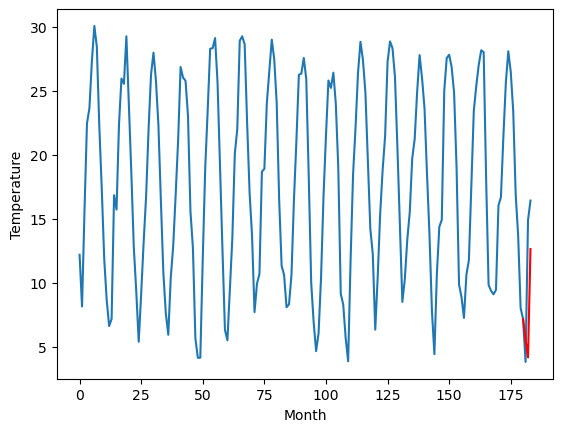

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.87		13.57		0.70
12.78		15.67		2.89
17.84		18.55		0.71
[180, 181, 182, 183]
[13.23, 13.565302810668946, 15.670326910018922, 18.54670949935913]


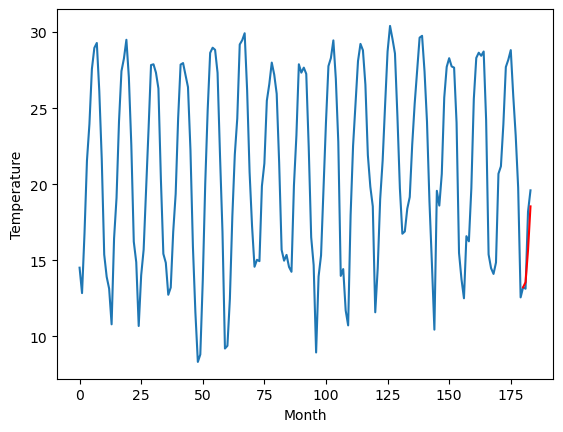

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
15.34		15.54		0.20
16.20		17.11		0.91
22.18		21.51		-0.67
[180, 181, 182, 183]
[7.18, 15.537051458358764, 17.110388298034668, 21.506820697784423]


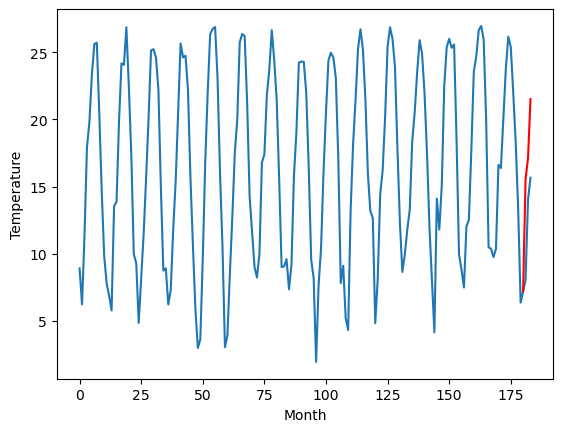

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.00		9.97		0.97
7.43		10.75		3.32
15.34		16.25		0.91
[180, 181, 182, 183]
[11.46, 9.97057870388031, 10.746089193820954, 16.248206827640534]


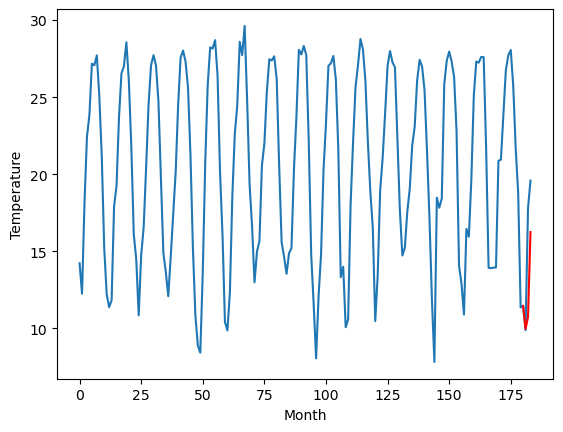

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.35		14.81		1.46
10.26		13.61		3.35
20.16		21.67		1.51
[180, 181, 182, 183]
[9.27, 14.808310906887055, 13.610423605442048, 21.669413130283356]


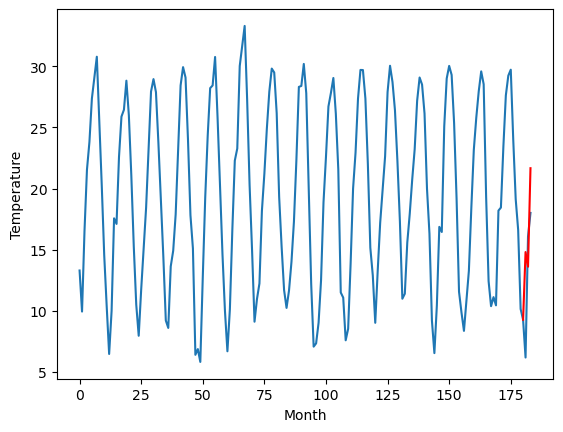

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.52		14.43		2.91
12.17		16.54		4.37
17.07		19.80		2.73
[180, 181, 182, 183]
[7.77, 14.434044885635377, 16.544975090026856, 19.801179695129395]


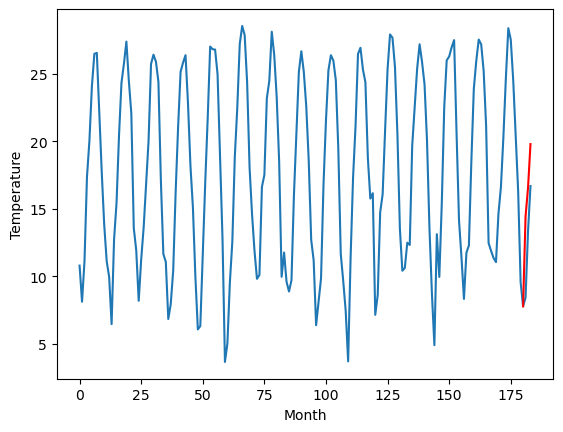

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.21		11.74		1.53
10.85		13.28		2.43
17.83		17.79		-0.04
[180, 181, 182, 183]
[6.59, 11.737917878627776, 13.278354861736297, 17.78926108121872]


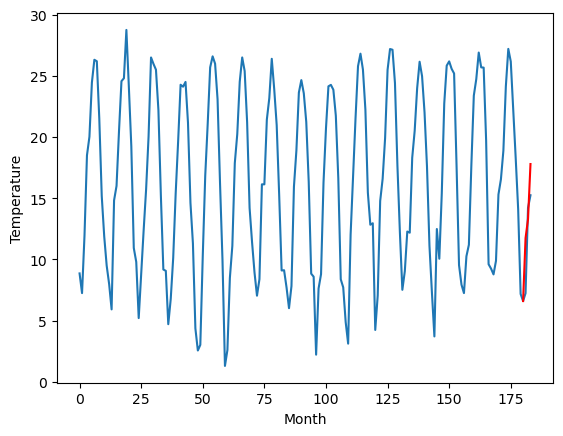

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.91		9.63		1.72
8.53		11.02		2.49
15.05		15.93		0.88
[180, 181, 182, 183]
[5.3, 9.634081280231475, 11.022829568386078, 15.931513822078704]


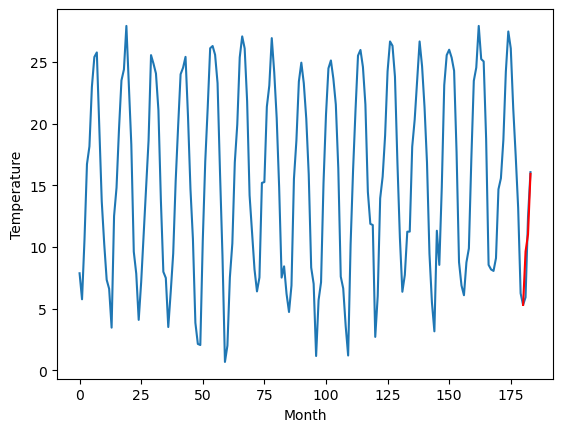

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.08		7.78		0.70
2.81		5.24		2.43
15.28		15.65		0.37
[180, 181, 182, 183]
[3.1, 7.782178575992584, 5.244589741230011, 15.650912220478059]


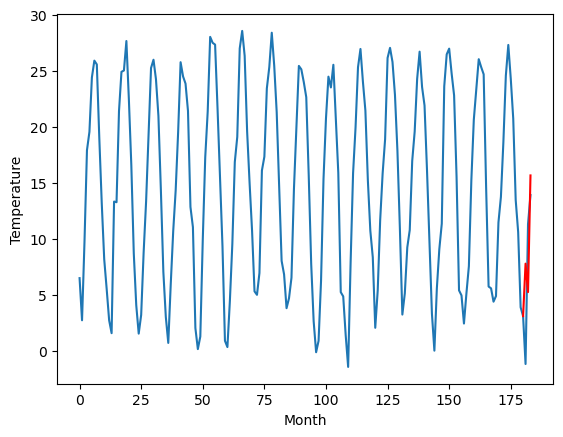

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
4.90		6.23		1.33
2.73		4.61		1.88
13.48		13.82		0.34
[180, 181, 182, 183]
[0.6, 6.227727582454682, 4.608259012699127, 13.815526773929596]


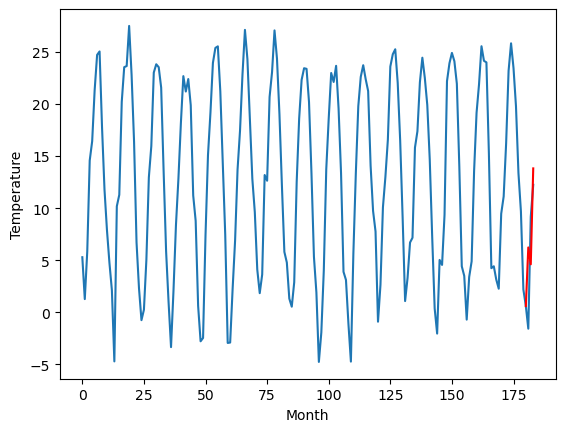

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
3.68		4.85		1.17
-0.63		2.73		3.36
11.10		12.82		1.72
[180, 181, 182, 183]
[-0.75, 4.8535679960250855, 2.7348322057724, 12.8171018743515]


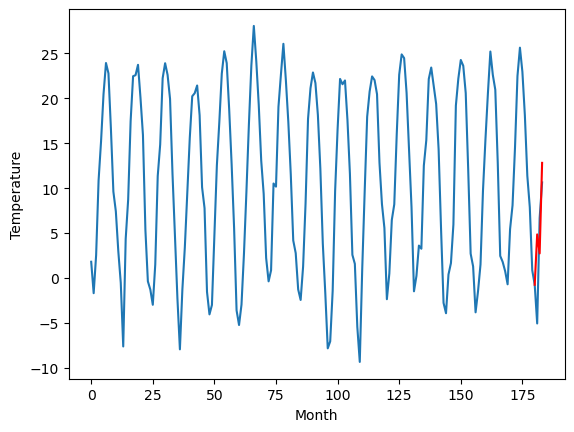

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.43   5.559204
1                 1   12.87  13.565303
2                 2   15.34  15.537051
3                 3    9.00   9.970579
4                 4   13.35  14.808311
5                 5   11.52  14.434045
6                 6   10.21  11.737918
7                 7    7.91   9.634081
8                 8    7.08   7.782179
9                 9    4.90   6.227728
10               10    3.68   4.853568


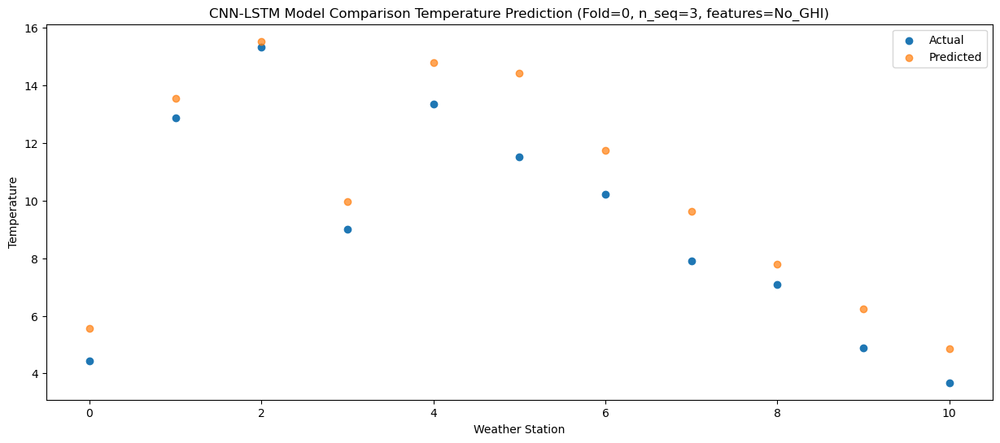

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    1.08   4.189296
1                 1   12.78  15.670327
2                 2   16.20  17.110388
3                 3    7.43  10.746089
4                 4   10.26  13.610424
5                 5   12.17  16.544975
6                 6   10.85  13.278355
7                 7    8.53  11.022830
8                 8    2.81   5.244590
9                 9    2.73   4.608259
10               10   -0.63   2.734832


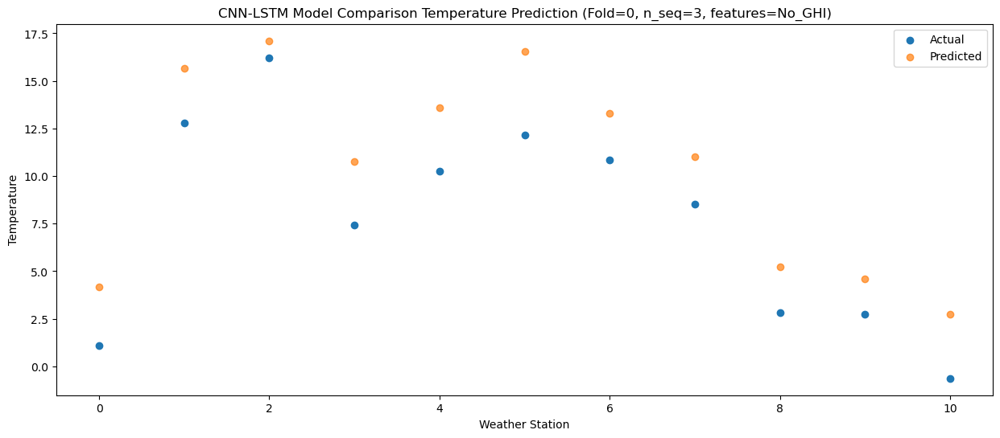

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   12.15  12.655013
1                 1   17.84  18.546709
2                 2   22.18  21.506821
3                 3   15.34  16.248207
4                 4   20.16  21.669413
5                 5   17.07  19.801180
6                 6   17.83  17.789261
7                 7   15.05  15.931514
8                 8   15.28  15.650912
9                 9   13.48  13.815527
10               10   11.10  12.817102


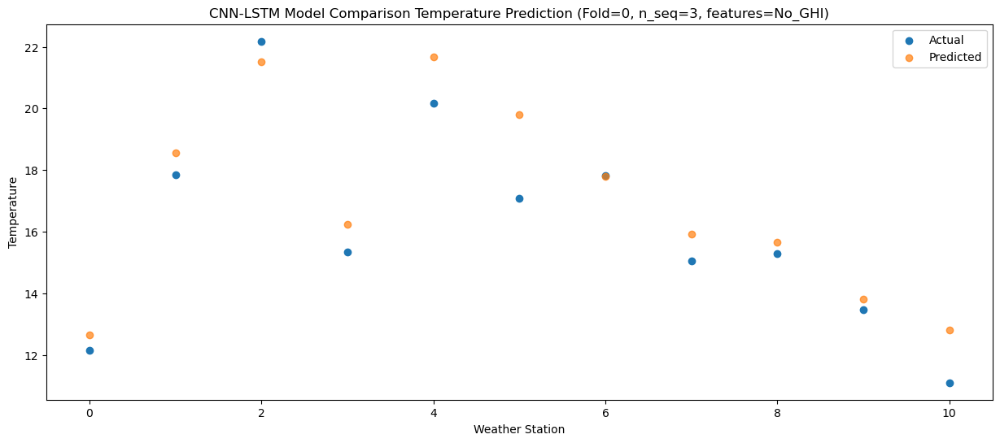

f, t:
[[ 4.43 12.87 15.34  9.   13.35 11.52 10.21  7.91  7.08  4.9   3.68]
 [ 1.08 12.78 16.2   7.43 10.26 12.17 10.85  8.53  2.81  2.73 -0.63]
 [12.15 17.84 22.18 15.34 20.16 17.07 17.83 15.05 15.28 13.48 11.1 ]]
[[ 5.55920402 13.56530281 15.53705146  9.9705787  14.80831091 14.43404489
  11.73791788  9.63408128  7.78217858  6.22772758  4.853568  ]
 [ 4.18929593 15.67032691 17.1103883  10.74608919 13.61042361 16.54497509
  13.27835486 11.02282957  5.24458974  4.60825901  2.73483221]
 [12.65501324 18.5467095  21.5068207  16.24820683 21.66941313 19.8011797
  17.78926108 15.93151382 15.65091222 13.81552677 12.81710187]]
Year at t+1:
t+1 SKRMSE: 1.423756
t+1 KRMSE: 1.423756
t+1 MAE: 1.256361
t+1 SKMAPE: 0.168042
t+1 R2_SCORE: 0.853909
t+1 KMAPE: 0.168042
t+1 PEARSON: 0.967982
t+1 AVERAGE ACTUAL: 9.117273
Year at t+2:
t+2 SKRMSE: 2.909249
t+2 KRMSE: 2.909249
t+2 MAE: 2.777306
t+2 SKMAPE: 1.064105
t+2 R2_SCORE: 0.686613
t+2 KMAPE: 0.093013
t+2 PEARSON: 0.972227
t+2 AVERAGE ACTUAL: 7.655455
Y

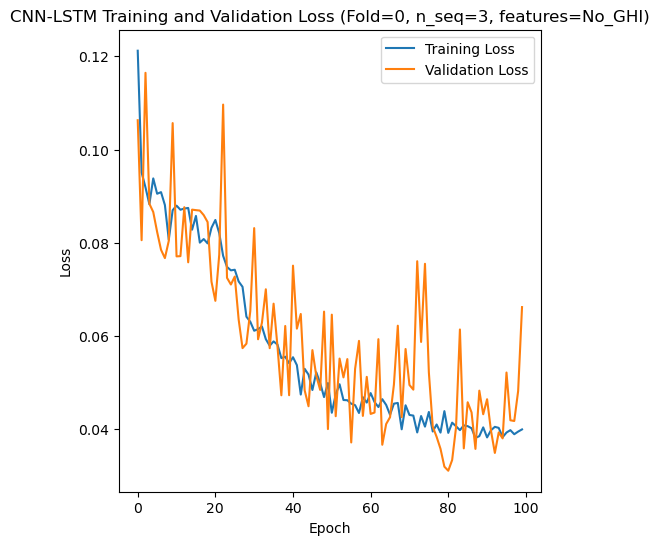

[[12.2  10.03 13.86 ... 24.46 19.58 17.03]
 [ 8.35  6.22 11.74 ... 22.47 18.02 13.98]
 [10.82  7.37 13.36 ... 24.57 19.57 16.15]
 ...
 [ 7.69  4.56 11.66 ... 25.3  19.83 13.28]
 [ 8.93  6.7  14.14 ... 25.37 21.51 12.55]
 [ 7.96  5.46 11.14 ... 25.13 20.28 10.63]]
Epoch 1/100
84/84 [==============================] - 34s 246ms/step - loss: 0.1306 - accuracy: 0.8810 - mae: 0.1153 - rmse: 0.1306 - mape: 20.6692 - pearson: 0.8308 - val_loss: 0.0998 - val_accuracy: 0.9000 - val_mae: 0.0813 - val_rmse: 0.0998 - val_mape: 16.2559 - val_pearson: 0.8587
Epoch 2/100
84/84 [==============================] - 16s 193ms/step - loss: 0.0978 - accuracy: 0.9048 - mae: 0.0842 - rmse: 0.0978 - mape: 15.7006 - pearson: 0.8599 - val_loss: 0.1178 - val_accuracy: 0.9000 - val_mae: 0.0985 - val_rmse: 0.1178 - val_mape: 18.0147 - val_pearson: 0.8610
Epoch 3/100
84/84 [==============================] - 16s 192ms/step - loss: 0.0908 - accuracy: 0.8929 - mae: 0.0797 - rmse: 0.0908 - mape: 15.0551 - pearson: 0.8532

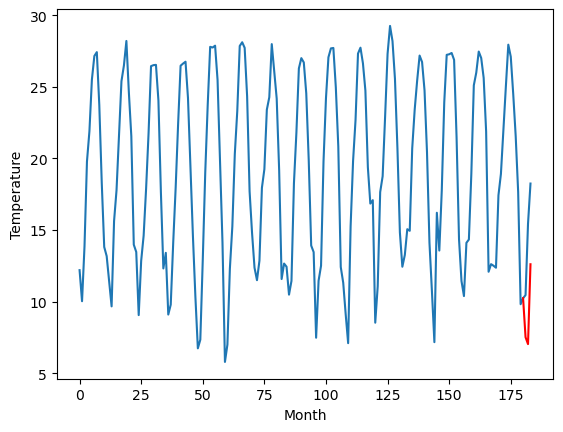

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.00		11.37		-0.63
12.66		10.18		-2.48
19.43		17.23		-2.20
[180, 181, 182, 183]
[6.41, 11.37129510641098, 10.175421249866485, 17.228075516223907]


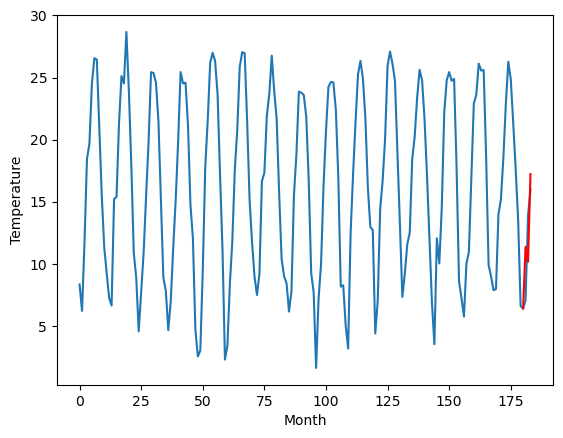

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.77		7.75		-1.02
9.26		6.07		-3.19
16.32		13.58		-2.74
[180, 181, 182, 183]
[7.6, 7.754683113098144, 6.067460393905639, 13.581114625930786]


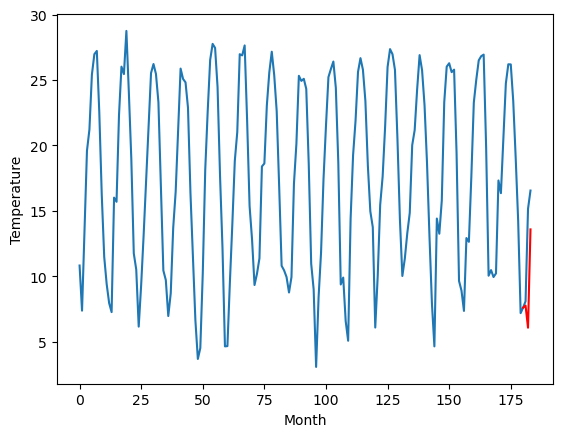

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.72		10.59		-0.13
9.13		7.48		-1.65
16.50		16.28		-0.22
[180, 181, 182, 183]
[11.89, 10.586082406044007, 7.481221623420716, 16.280206151008606]


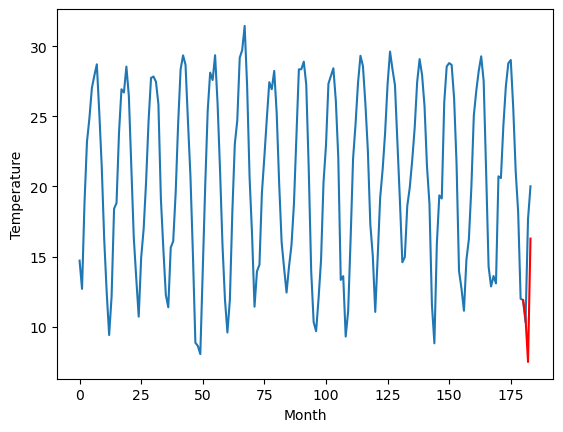

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.70		14.37		-0.33
13.00		10.93		-2.07
20.61		20.17		-0.44
[180, 181, 182, 183]
[10.96, 14.367563984394074, 10.932342789173127, 20.16726901292801]


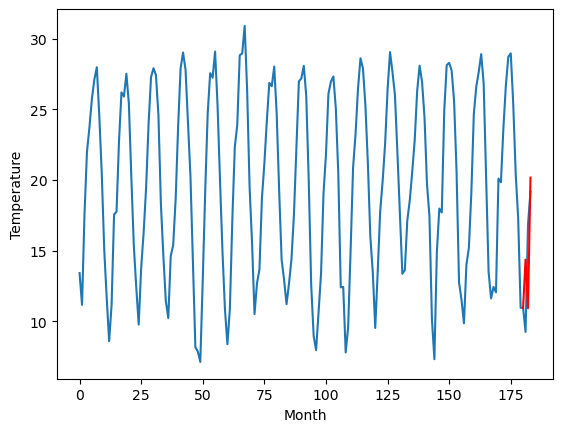

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.91		13.50		1.59
12.29		11.10		-1.19
19.63		18.83		-0.80
[180, 181, 182, 183]
[7.75, 13.498489772975445, 11.101091777980328, 18.830606376826765]


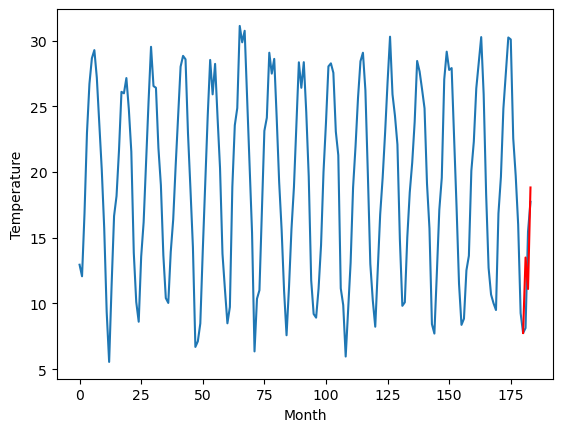

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.75		12.11		-0.64
13.53		11.06		-2.47
19.81		17.95		-1.86
[180, 181, 182, 183]
[6.17, 12.107878160476684, 11.056904864311218, 17.948642325401305]


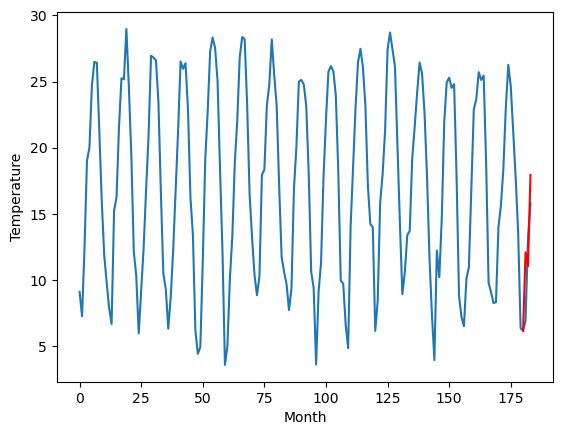

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.81		8.05		-0.76
5.81		2.83		-2.98
17.13		14.55		-2.58
[180, 181, 182, 183]
[4.57, 8.054016942977904, 2.8348907184600822, 14.550500268936156]


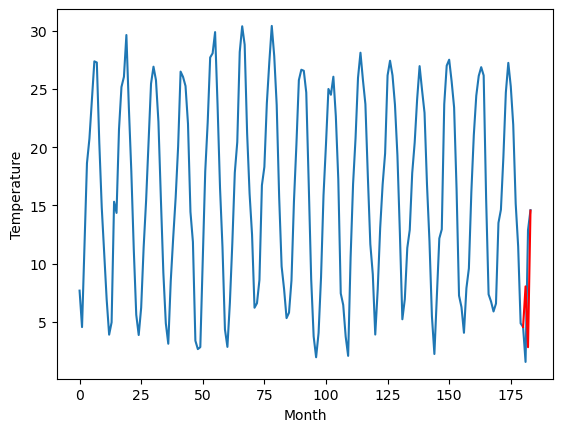

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.34		6.77		-0.57
2.56		0.71		-1.85
15.12		13.13		-1.99
[180, 181, 182, 183]
[5.46, 6.7732450389862064, 0.7133795642852787, 13.133037271499635]


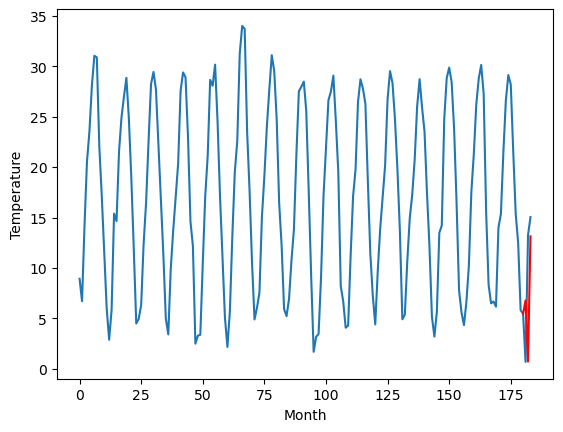

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.04		8.38		-0.66
4.67		2.89		-1.78
15.38		14.40		-0.98
[180, 181, 182, 183]
[5.42, 8.38170646905899, 2.887830488681793, 14.401750319004059]


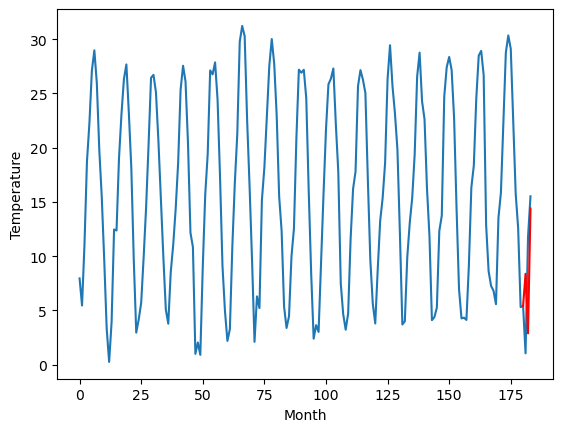

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.12		6.17		0.05
5.16		4.44		-0.72
12.38		11.87		-0.51
[180, 181, 182, 183]
[2.17, 6.171765170097351, 4.444004974365234, 11.868643245697022]


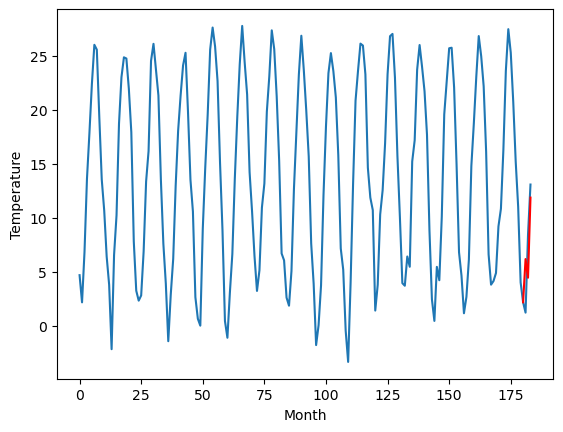

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    8.38   7.513979
1                 1   12.00  11.371295
2                 2    8.77   7.754683
3                 3   10.72  10.586082
4                 4   14.70  14.367564
5                 5   11.91  13.498490
6                 6   12.75  12.107878
7                 7    8.81   8.054017
8                 8    7.34   6.773245
9                 9    9.04   8.381706
10               10    6.12   6.171765


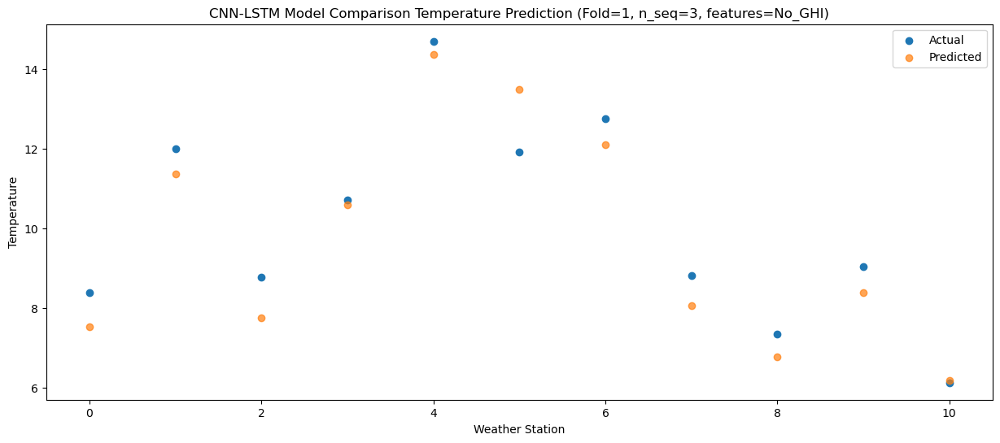

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    8.60   7.033526
1                 1   12.66  10.175421
2                 2    9.26   6.067460
3                 3    9.13   7.481222
4                 4   13.00  10.932343
5                 5   12.29  11.101092
6                 6   13.53  11.056905
7                 7    5.81   2.834891
8                 8    2.56   0.713380
9                 9    4.67   2.887830
10               10    5.16   4.444005


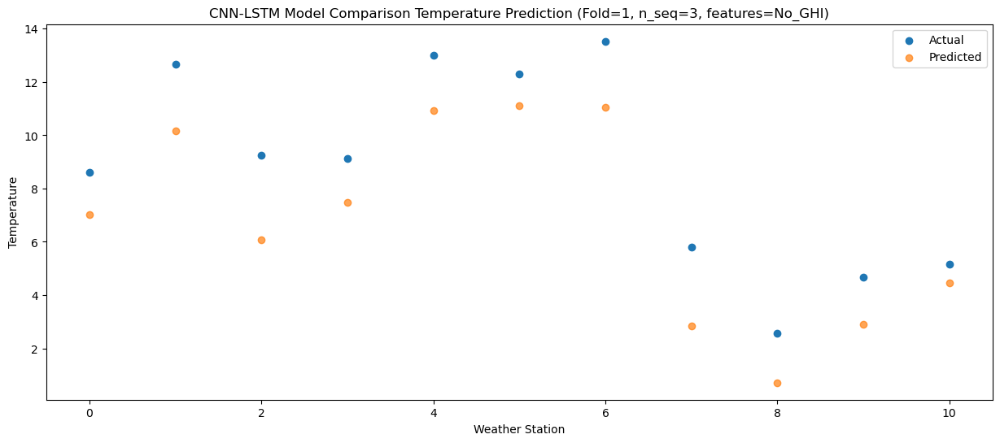

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   13.58  12.612171
1                 1   19.43  17.228076
2                 2   16.32  13.581115
3                 3   16.50  16.280206
4                 4   20.61  20.167269
5                 5   19.63  18.830606
6                 6   19.81  17.948642
7                 7   17.13  14.550500
8                 8   15.12  13.133037
9                 9   15.38  14.401750
10               10   12.38  11.868643


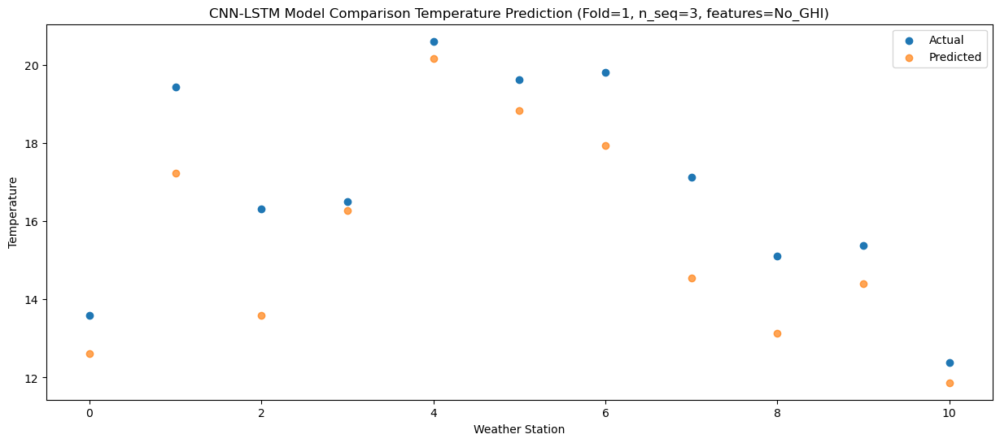

f, t:
[[ 8.38 12.    8.77 10.72 14.7  11.91 12.75  8.81  7.34  9.04  6.12]
 [ 8.6  12.66  9.26  9.13 13.   12.29 13.53  5.81  2.56  4.67  5.16]
 [13.58 19.43 16.32 16.5  20.61 19.63 19.81 17.13 15.12 15.38 12.38]]
[[ 7.51397874 11.37129511  7.75468311 10.58608241 14.36756398 13.49848977
  12.10787816  8.05401694  6.77324504  8.38170647  6.17176517]
 [ 7.03352623 10.17542125  6.06746039  7.48122162 10.93234279 11.10109178
  11.05690486  2.83489072  0.71337956  2.88783049  4.44400497]
 [12.61217051 17.22807552 13.58111463 16.28020615 20.16726901 18.83060638
  17.94864233 14.55050027 13.13303727 14.40175032 11.86864325]]
Year at t+1:
t+1 SKRMSE: 0.772772
t+1 KRMSE: 0.772772
t+1 MAE: 0.658164
t+1 SKMAPE: 0.066787
t+1 R2_SCORE: 0.901066
t+1 KMAPE: 0.066787
t+1 PEARSON: 0.938472
t+1 AVERAGE ACTUAL: 10.049091
Year at t+2:
t+2 SKRMSE: 2.116874
t+2 KRMSE: 2.116874
t+2 MAE: 1.994720
t+2 SKMAPE: 0.281465
t+2 R2_SCORE: 0.661534
t+2 KMAPE: 0.281465
t+2 PEARSON: 0.962066
t+2 AVERAGE ACTUAL: 8.788182

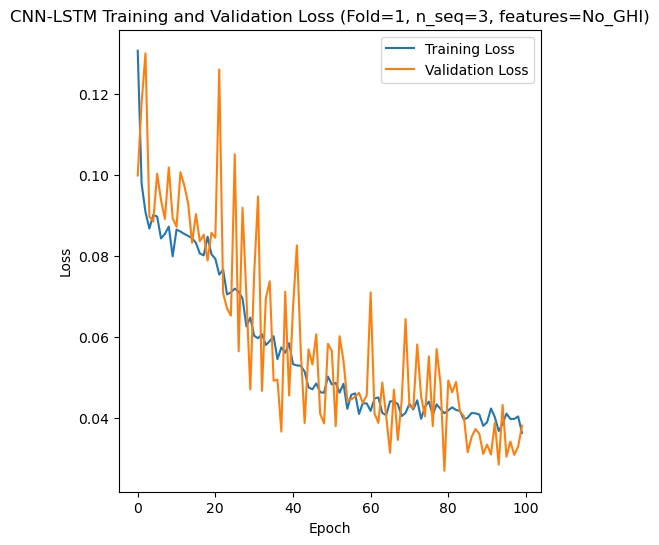

[[ 8.61  4.71 12.22 ... 22.49 18.22 13.52]
 [ 6.28  3.18  8.73 ... 22.36 17.39  7.52]
 [17.82 16.52 20.35 ... 28.79 25.32 22.93]
 ...
 [ 6.77  9.55 12.16 ... 24.55 20.29 10.24]
 [12.04 12.81 10.78 ... 23.32 20.33 13.93]
 [ 8.57  6.56 11.36 ... 21.36 16.14 12.65]]
Epoch 1/100
84/84 [==============================] - 33s 201ms/step - loss: 0.1294 - accuracy: 0.9048 - mae: 0.1126 - rmse: 0.1294 - mape: 20.7485 - pearson: 0.8397 - val_loss: 0.0914 - val_accuracy: 1.0000 - val_mae: 0.0840 - val_rmse: 0.0914 - val_mape: 16.4448 - val_pearson: 0.9595
Epoch 2/100
84/84 [==============================] - 15s 178ms/step - loss: 0.0936 - accuracy: 0.9167 - mae: 0.0801 - rmse: 0.0936 - mape: 15.3114 - pearson: 0.8726 - val_loss: 0.0589 - val_accuracy: 1.0000 - val_mae: 0.0528 - val_rmse: 0.0589 - val_mape: 9.6134 - val_pearson: 0.9640
Epoch 3/100
84/84 [==============================] - 14s 171ms/step - loss: 0.0907 - accuracy: 0.9167 - mae: 0.0761 - rmse: 0.0907 - mape: 14.2134 - pearson: 0.8903 

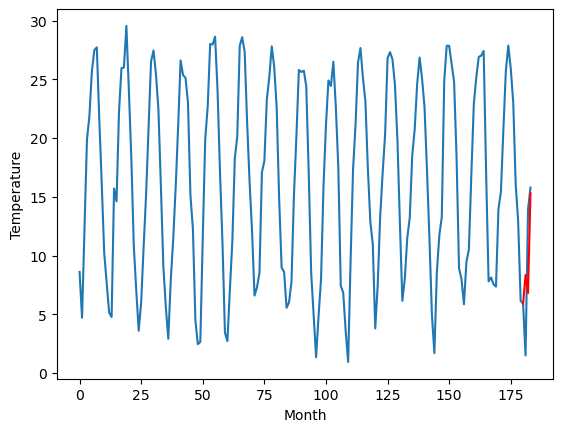

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.53		8.96		0.43
4.49		6.55		2.06
14.68		15.70		1.02
[180, 181, 182, 183]
[2.63, 8.961250797510147, 6.549471393823623, 15.701929584741592]


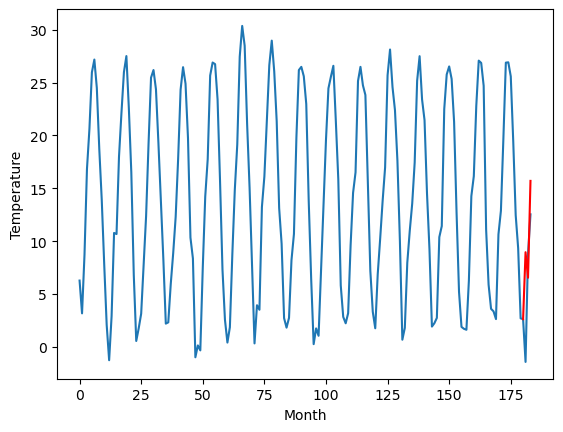

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.94		8.71		1.77
9.67		11.22		1.55
11.48		10.46		-1.02
[180, 181, 182, 183]
[16.55, 8.71006205558777, 11.224674730300904, 10.456310658454896]


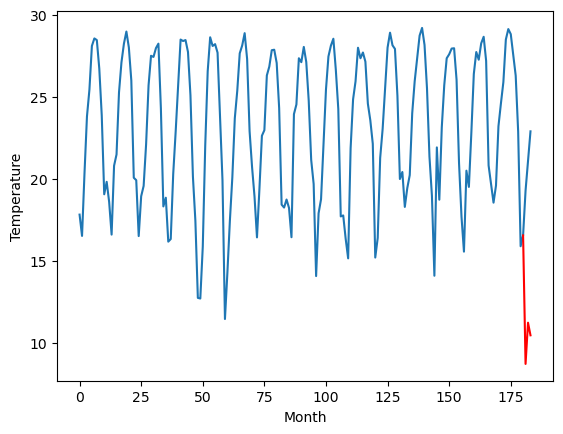

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.74		18.71		3.97
14.76		20.61		5.85
18.87		24.08		5.21
[180, 181, 182, 183]
[-0.83, 18.7051318359375, 20.605152912139893, 24.08372218132019]


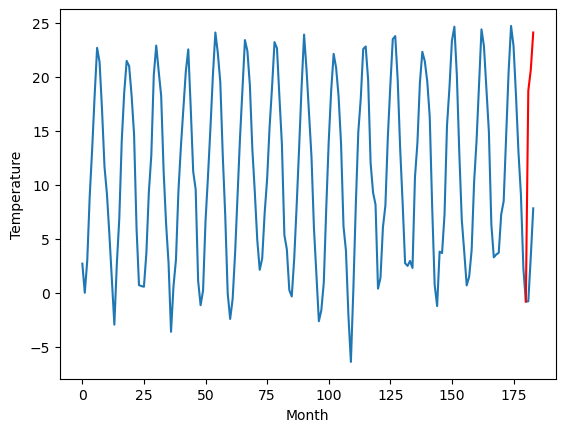

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
3.03		4.43		1.40
2.29		6.37		4.08
9.62		8.91		-0.71
[180, 181, 182, 183]
[11.52, 4.434858613014221, 6.369168810844421, 8.910871319770813]


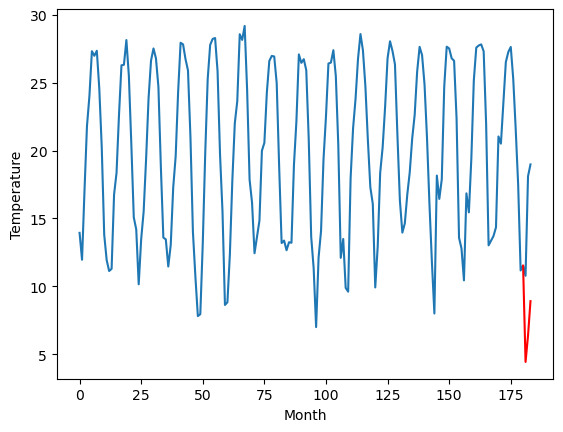

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.35		15.12		1.77
11.00		16.53		5.53
19.38		20.96		1.58
[180, 181, 182, 183]
[11.47, 15.117106976509094, 16.5300901556015, 20.958549323081968]


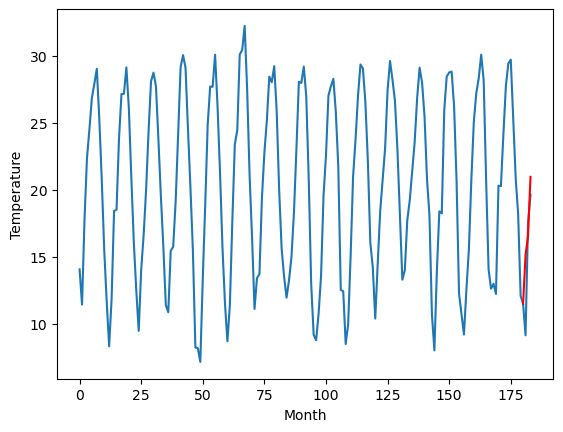

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.35		14.35		1.00
10.24		13.48		3.24
20.61		20.86		0.25
[180, 181, 182, 183]
[7.75, 14.35081480741501, 13.484146225452424, 20.860878574848176]


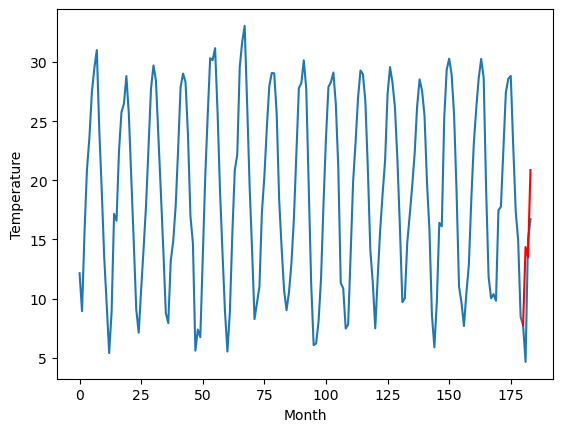

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.68		14.45		1.77
15.60		16.46		0.86
18.70		17.21		-1.49
[180, 181, 182, 183]
[4.9, 14.453137292861939, 16.455252780914307, 17.21090985774994]


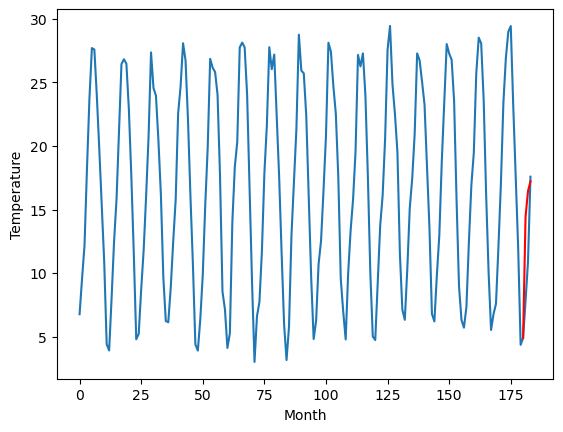

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.71		9.51		2.80
5.79		11.90		6.11
5.39		10.40		5.01
[180, 181, 182, 183]
[14.14, 9.514356870651245, 11.895138521194458, 10.396602292060852]


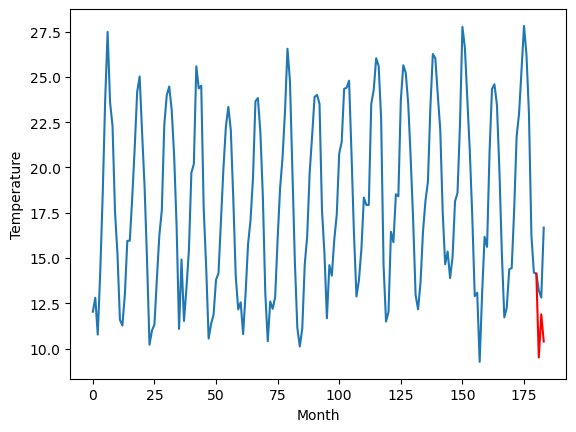

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.63		13.21		1.58
12.13		15.12		2.99
19.01		18.59		-0.42
[180, 181, 182, 183]
[5.55, 13.211552062034606, 15.121134796142577, 18.587497272491454]


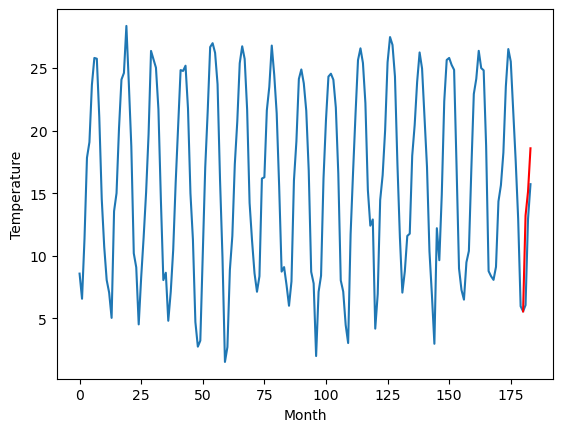

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.90		9.28		0.38
10.25		10.95		0.70
16.46		15.27		-1.19
[180, 181, 182, 183]
[3.19, 9.275552697181702, 10.95074266910553, 15.271020359992981]


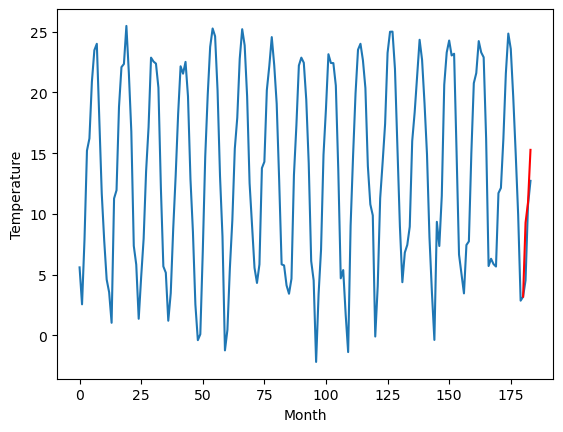

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    8.31   8.346515
1                 1    8.53   8.961251
2                 2    6.94   8.710062
3                 3   14.74  18.705132
4                 4    3.03   4.434859
5                 5   13.35  15.117107
6                 6   13.35  14.350815
7                 7   12.68  14.453137
8                 8    6.71   9.514357
9                 9   11.63  13.211552
10               10    8.90   9.275553


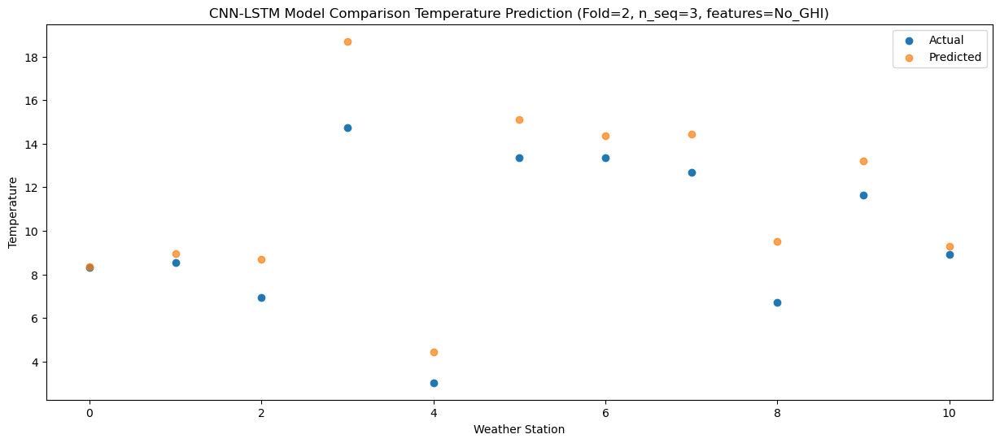

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.91   6.807410
1                 1    4.49   6.549471
2                 2    9.67  11.224675
3                 3   14.76  20.605153
4                 4    2.29   6.369169
5                 5   11.00  16.530090
6                 6   10.24  13.484146
7                 7   15.60  16.455253
8                 8    5.79  11.895139
9                 9   12.13  15.121135
10               10   10.25  10.950743


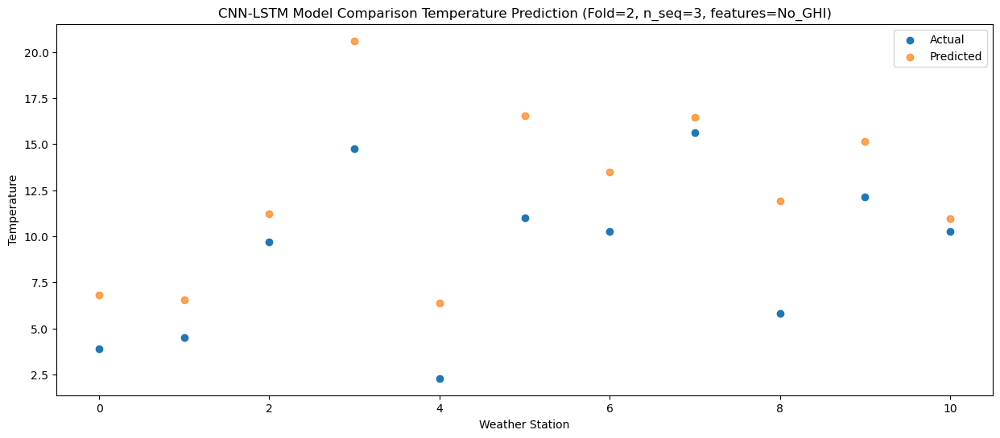

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   16.33  15.306773
1                 1   14.68  15.701930
2                 2   11.48  10.456311
3                 3   18.87  24.083722
4                 4    9.62   8.910871
5                 5   19.38  20.958549
6                 6   20.61  20.860879
7                 7   18.70  17.210910
8                 8    5.39  10.396602
9                 9   19.01  18.587497
10               10   16.46  15.271020


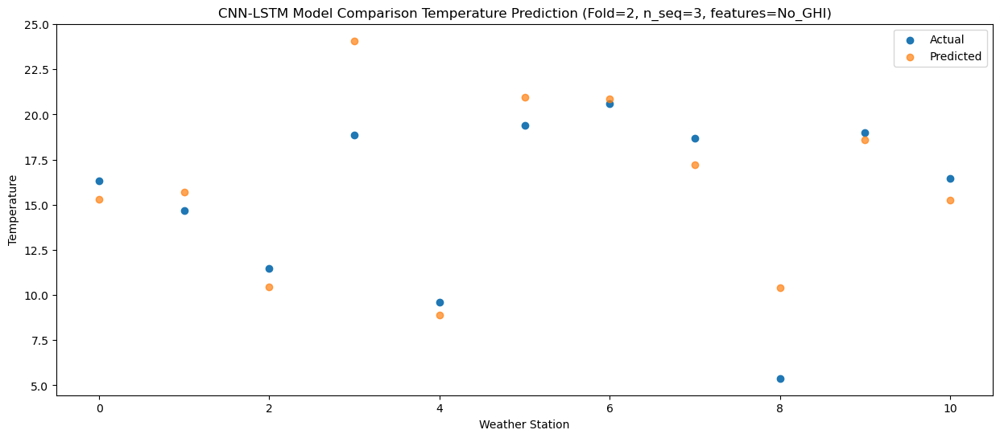

f, t:
[[ 8.31  8.53  6.94 14.74  3.03 13.35 13.35 12.68  6.71 11.63  8.9 ]
 [ 3.91  4.49  9.67 14.76  2.29 11.   10.24 15.6   5.79 12.13 10.25]
 [16.33 14.68 11.48 18.87  9.62 19.38 20.61 18.7   5.39 19.01 16.46]]
[[ 8.34651508  8.9612508   8.71006206 18.70513184  4.43485861 15.11710698
  14.35081481 14.45313729  9.51435687 13.21155206  9.2755527 ]
 [ 6.80740979  6.54947139 11.22467473 20.60515291  6.36916881 16.53009016
  13.48414623 16.45525278 11.89513852 15.1211348  10.95074267]
 [15.30677273 15.70192958 10.45631066 24.08372218  8.91087132 20.95854932
  20.86087857 17.21090986 10.39660229 18.58749727 15.27102036]]
Year at t+1:
t+1 SKRMSE: 1.877895
t+1 KRMSE: 1.877895
t+1 MAE: 1.537304
t+1 SKMAPE: 0.180541
t+1 R2_SCORE: 0.700321
t+1 KMAPE: 0.180541
t+1 PEARSON: 0.931042
t+1 AVERAGE ACTUAL: 9.833636
Year at t+2:
t+2 SKRMSE: 3.746603
t+2 KRMSE: 3.746603
t+2 MAE: 3.260217
t+2 SKMAPE: 0.525595
t+2 R2_SCORE: 0.210370
t+2 KMAPE: 0.525595
t+2 PEARSON: 0.827573
t+2 AVERAGE ACTUAL: 9.102727


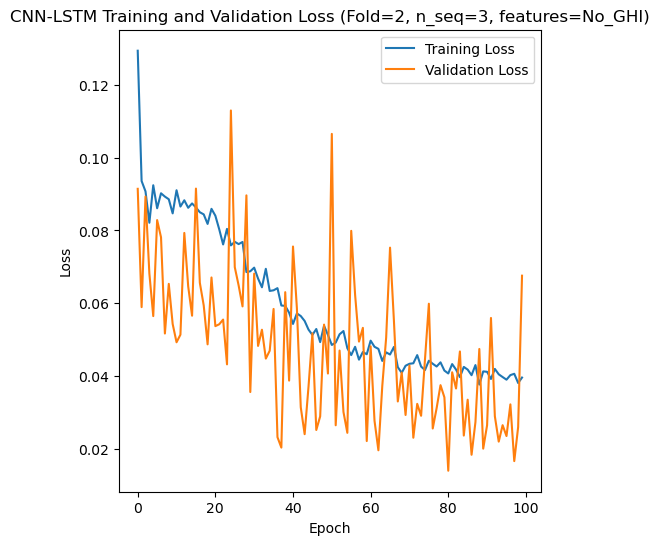

[[ 8.9   6.89 11.3  ... 22.19 16.88 13.54]
 [ 7.02  3.15 10.24 ... 22.31 18.92 11.32]
 [ 7.65  9.7   9.44 ... 25.68 20.65 11.46]
 ...
 [ 9.57 11.93 12.22 ... 30.9  25.01 12.37]
 [ 9.04  9.3   8.59 ... 17.72 17.26 10.73]
 [ 3.2   0.4   3.78 ... 18.92 14.39 10.04]]
Epoch 1/100
84/84 [==============================] - 42s 249ms/step - loss: 0.1223 - accuracy: 0.9524 - mae: 0.1086 - rmse: 0.1223 - mape: 20.4946 - pearson: 0.8588 - val_loss: 0.1367 - val_accuracy: 0.8000 - val_mae: 0.1171 - val_rmse: 0.1367 - val_mape: 23.0244 - val_pearson: 0.7157
Epoch 2/100
84/84 [==============================] - 15s 179ms/step - loss: 0.0922 - accuracy: 0.9524 - mae: 0.0790 - rmse: 0.0922 - mape: 15.0788 - pearson: 0.8916 - val_loss: 0.1096 - val_accuracy: 0.8000 - val_mae: 0.0937 - val_rmse: 0.1096 - val_mape: 21.6802 - val_pearson: 0.7864
Epoch 3/100
84/84 [==============================] - 14s 169ms/step - loss: 0.0867 - accuracy: 0.9524 - mae: 0.0745 - rmse: 0.0867 - mape: 14.5026 - pearson: 0.8918

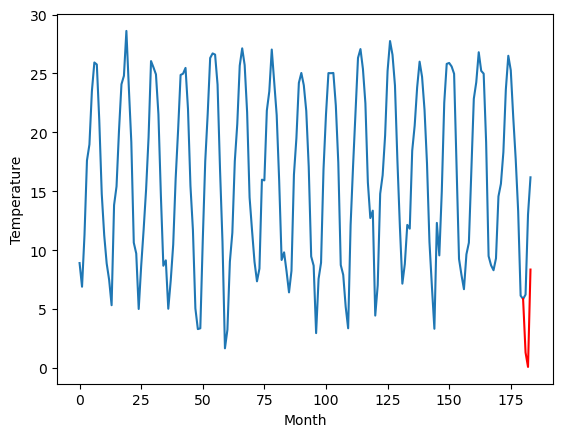

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.75		7.71		-0.04
4.03		1.13		-2.90
16.00		16.17		0.17
[180, 181, 182, 183]
[3.2, 7.706181311607361, 1.1255452871322635, 16.174786353111266]


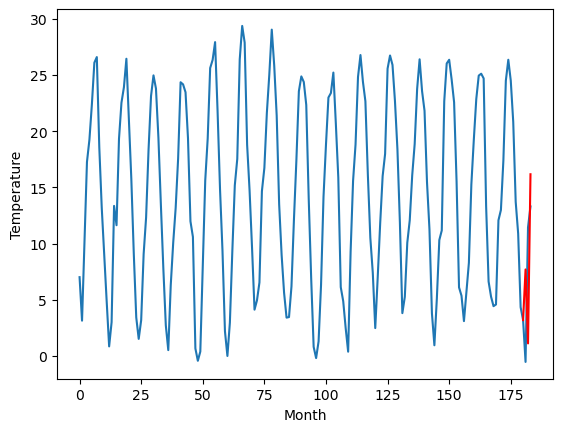

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.28		7.01		-1.27
10.58		6.52		-4.06
11.73		9.52		-2.21
[180, 181, 182, 183]
[8.48, 7.010914749912917, 6.5188674102351065, 9.521043933443725]


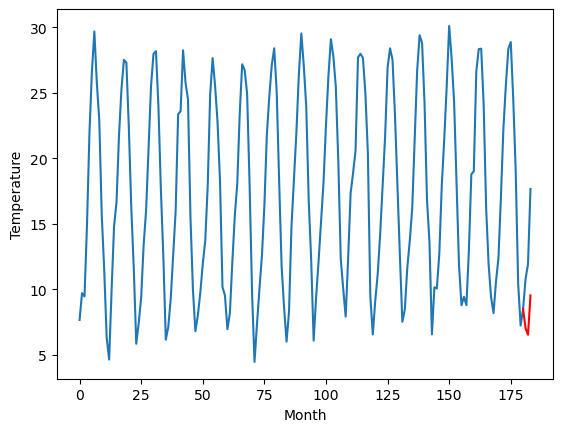

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.19		5.80		-0.39
4.87		2.01		-2.86
15.08		13.64		-1.44
[180, 181, 182, 183]
[1.55, 5.800563478469849, 2.0057083606719974, 13.637022638320923]


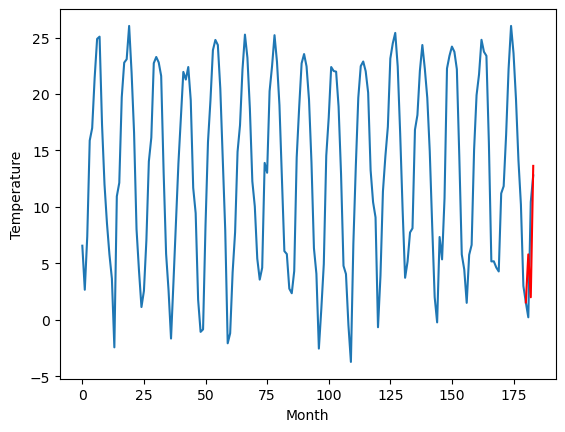

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.10		5.14		0.04
1.23		-1.72		-2.95
14.31		13.85		-0.46
[180, 181, 182, 183]
[1.08, 5.135549969673157, -1.715622954368591, 13.85324568271637]


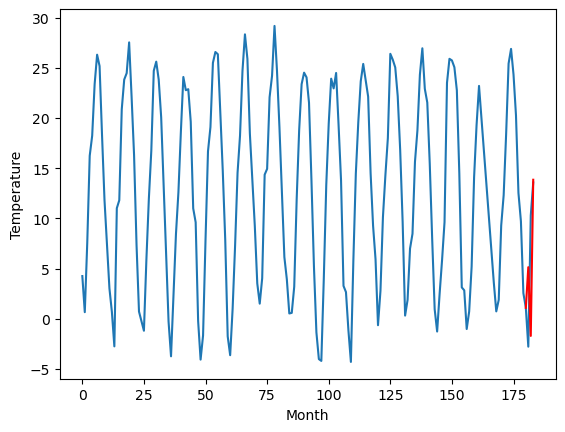

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
2.80		2.59		-0.21
0.08		-3.33		-3.41
11.41		11.10		-0.31
[180, 181, 182, 183]
[0.21, 2.5939791202545166, -3.329669713973999, 11.098504304885864]


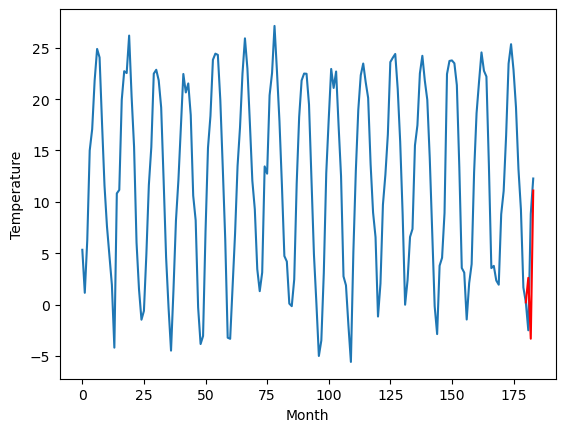

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.60		4.69		-0.91
5.70		3.28		-2.42
8.67		11.43		2.76
[180, 181, 182, 183]
[-8.22, 4.692031102180481, 3.281496124267578, 11.431993560791016]


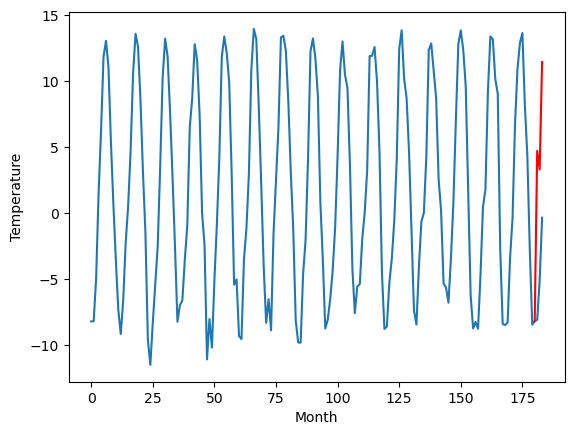

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
-7.69		-8.23		-0.54
-4.84		-8.86		-4.02
-3.24		-4.23		-0.99
[180, 181, 182, 183]
[10.04, -8.22515703715384, -8.861820056810975, -4.226873233690858]


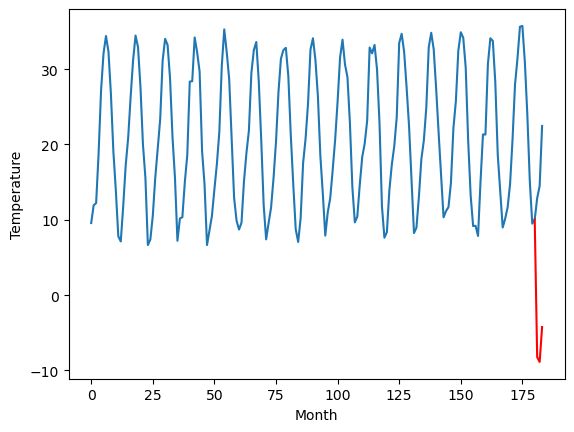

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.79		9.48		-1.31
11.72		9.11		-2.61
11.50		10.62		-0.88
[180, 181, 182, 183]
[9.17, 9.478417142927647, 9.114764079153538, 10.617975815832615]


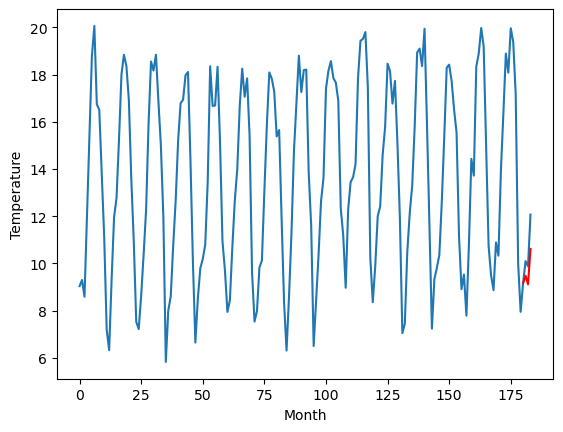

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.02		6.37		0.35
5.90		5.15		-0.75
10.90		13.52		2.62
[180, 181, 182, 183]
[0.94, 6.372625150680541, 5.152991213798522, 13.516025462150573]


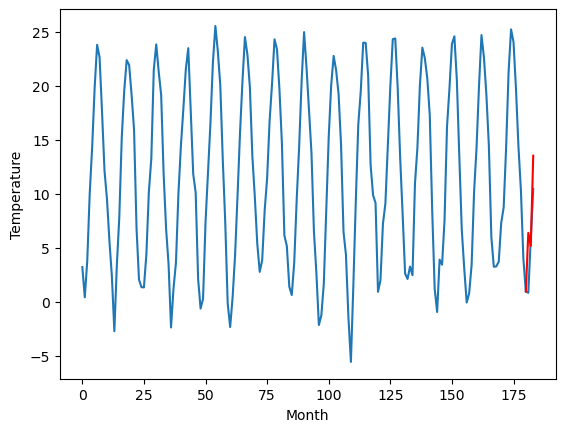

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
1.64		0.53		-1.11
0.84		-1.32		-2.16
8.03		7.75		-0.28
[180, 181, 182, 183]
[-0.13, 0.5268299102783205, -1.3198335647583006, 7.749177169799805]


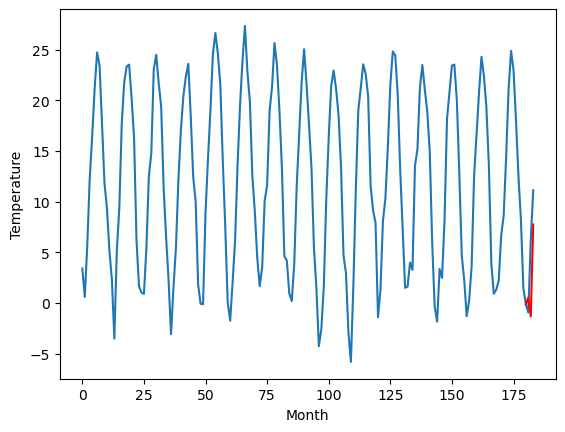

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    2.92   1.299708
1                 1    7.75   7.706181
2                 2    8.28   7.010915
3                 3    6.19   5.800563
4                 4    5.10   5.135550
5                 5    2.80   2.593979
6                 6    5.60   4.692031
7                 7   -7.69  -8.225157
8                 8   10.79   9.478417
9                 9    6.02   6.372625
10               10    1.64   0.526830


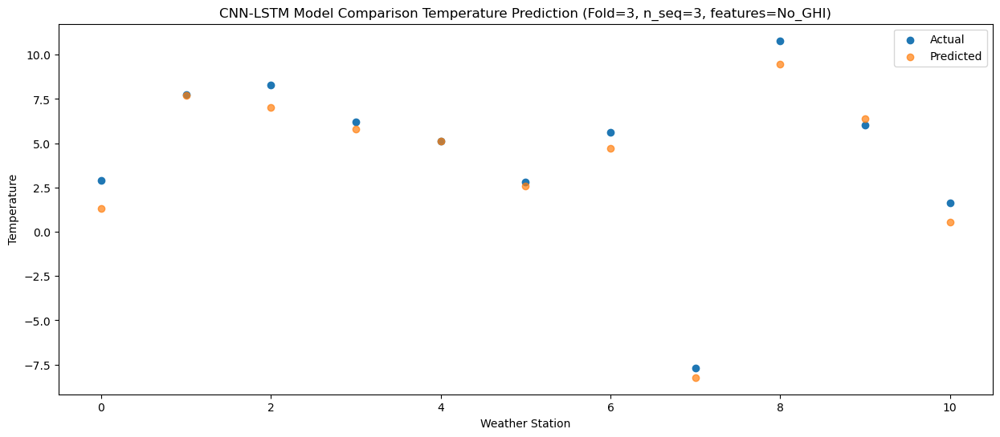

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.29   0.080477
1                 1    4.03   1.125545
2                 2   10.58   6.518867
3                 3    4.87   2.005708
4                 4    1.23  -1.715623
5                 5    0.08  -3.329670
6                 6    5.70   3.281496
7                 7   -4.84  -8.861820
8                 8   11.72   9.114764
9                 9    5.90   5.152991
10               10    0.84  -1.319834


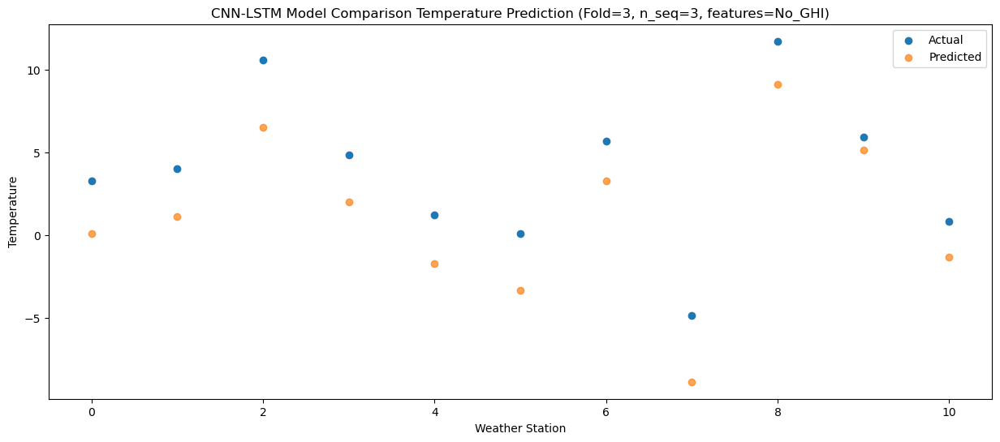

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   10.09   8.347476
1                 1   16.00  16.174786
2                 2   11.73   9.521044
3                 3   15.08  13.637023
4                 4   14.31  13.853246
5                 5   11.41  11.098504
6                 6    8.67  11.431994
7                 7   -3.24  -4.226873
8                 8   11.50  10.617976
9                 9   10.90  13.516025
10               10    8.03   7.749177


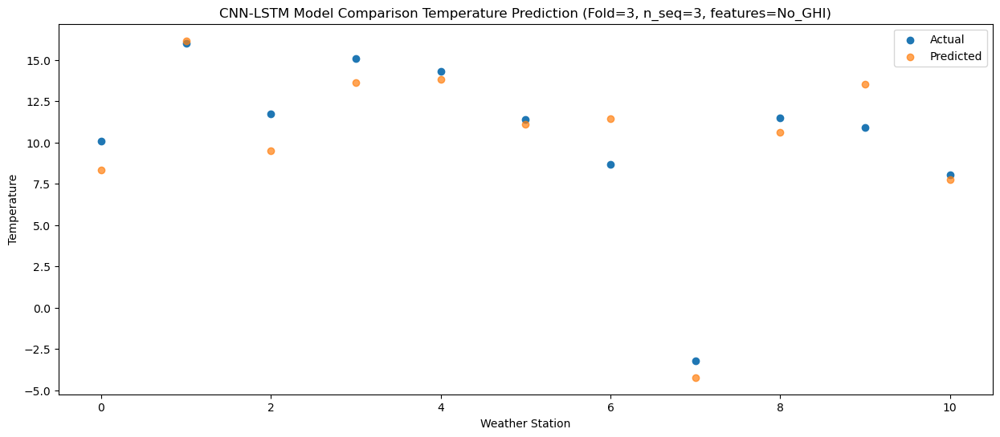

f, t:
[[ 2.92  7.75  8.28  6.19  5.1   2.8   5.6  -7.69 10.79  6.02  1.64]
 [ 3.29  4.03 10.58  4.87  1.23  0.08  5.7  -4.84 11.72  5.9   0.84]
 [10.09 16.   11.73 15.08 14.31 11.41  8.67 -3.24 11.5  10.9   8.03]]
[[ 1.29970844  7.70618131  7.01091475  5.80056348  5.13554997  2.59397912
   4.6920311  -8.22515704  9.47841714  6.37262515  0.52682991]
 [ 0.08047743  1.12554529  6.51886741  2.00570836 -1.71562295 -3.32966971
   3.28149612 -8.86182006  9.11476408  5.15299121 -1.31983356]
 [ 8.34747572 16.17478635  9.52104393 13.63702264 13.85324568 11.0985043
  11.43199356 -4.22687323 10.61797582 13.51602546  7.74917717]]
Year at t+1:
t+1 SKRMSE: 0.885630
t+1 KRMSE: 0.885630
t+1 MAE: 0.707701
t+1 SKMAPE: 0.177082
t+1 R2_SCORE: 0.963021
t+1 KMAPE: 0.164429
t+1 PEARSON: 0.982267
t+1 AVERAGE ACTUAL: 4.490909
Year at t+2:
t+2 SKRMSE: 2.981317
t+2 KRMSE: 2.981317
t+2 MAE: 2.849736
t+2 SKMAPE: 4.714484
t+2 R2_SCORE: 0.559183
t+2 KMAPE: 4.563401
t+2 PEARSON: 0.967786
t+2 AVERAGE ACTUAL: 3.945455
Y

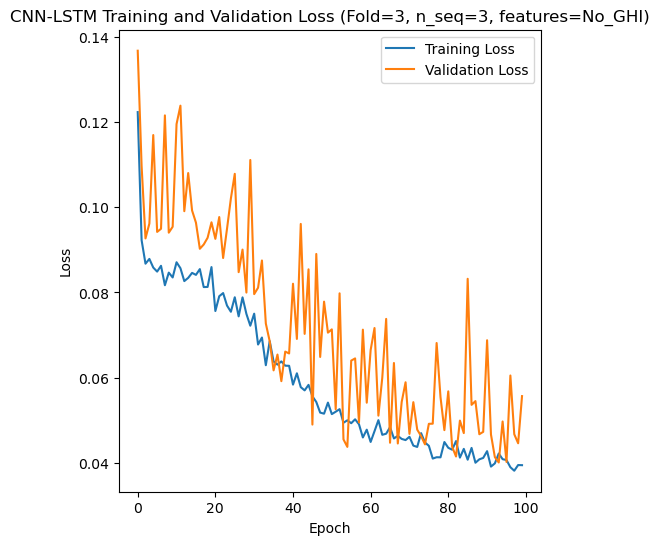

[[ 4.89  1.26  7.78 ... 22.59 18.46  9.82]
 [15.38 13.87 17.63 ... 26.66 22.89 20.2 ]
 [11.49  8.39 14.48 ... 24.97 20.83 17.82]
 ...
 [ 7.64  3.61 10.44 ... 21.3  17.62 11.34]
 [ 4.26  0.29  5.21 ... 21.47 15.54  9.34]
 [ 3.62 -0.32  6.05 ... 19.99 14.92  8.29]]
Epoch 1/100
84/84 [==============================] - 38s 237ms/step - loss: 0.1276 - accuracy: 0.8571 - mae: 0.1108 - rmse: 0.1276 - mape: 20.0084 - pearson: 0.8102 - val_loss: 0.1217 - val_accuracy: 1.0000 - val_mae: 0.1068 - val_rmse: 0.1217 - val_mape: 20.1625 - val_pearson: 0.8424
Epoch 2/100
84/84 [==============================] - 15s 179ms/step - loss: 0.0917 - accuracy: 0.9048 - mae: 0.0786 - rmse: 0.0917 - mape: 14.7947 - pearson: 0.8271 - val_loss: 0.0959 - val_accuracy: 1.0000 - val_mae: 0.0830 - val_rmse: 0.0959 - val_mape: 16.7358 - val_pearson: 0.9559
Epoch 3/100
84/84 [==============================] - 13s 154ms/step - loss: 0.0920 - accuracy: 0.9048 - mae: 0.0798 - rmse: 0.0920 - mape: 14.8944 - pearson: 0.8599

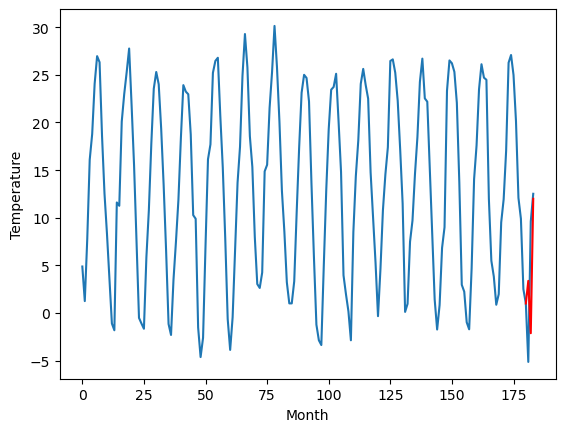

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.59		5.44		-0.15
9.02		6.45		-2.57
10.62		9.77		-0.85
[180, 181, 182, 183]
[14.25, 5.443809106349945, 6.454544379711151, 9.765660836696625]


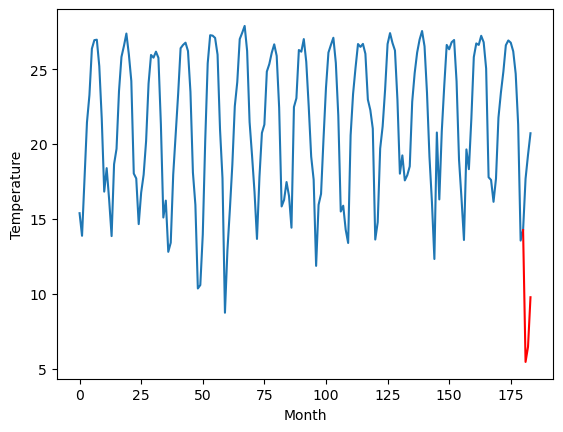

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
15.41		15.81		0.40
13.49		14.88		1.39
22.82		23.19		0.37
[180, 181, 182, 183]
[9.06, 15.808611904382706, 14.881091092824937, 23.1906127679348]


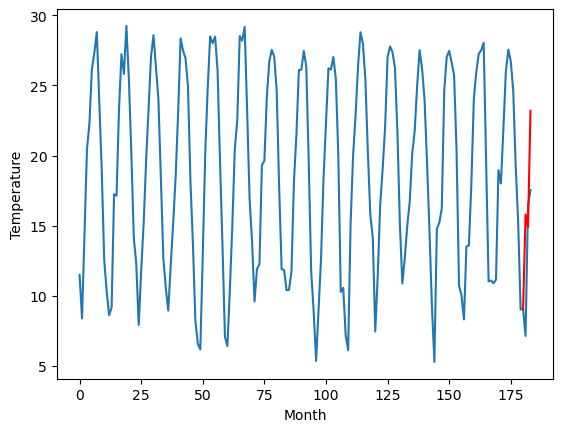

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.57		11.67		1.10
7.11		7.73		0.62
18.07		19.39		1.32
[180, 181, 182, 183]
[7.48, 11.667732840180397, 7.726957207322121, 19.39356506407261]


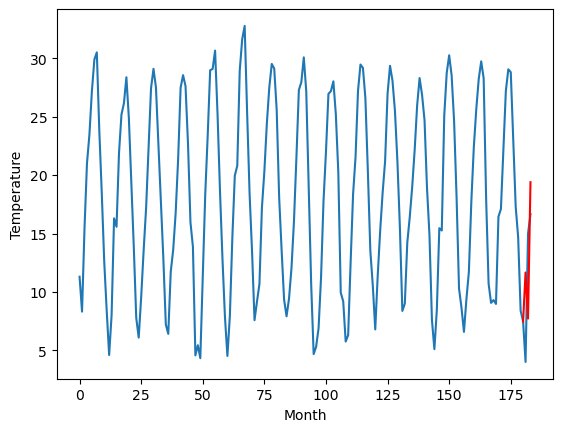

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.71		11.52		0.81
6.82		7.55		0.73
17.74		19.22		1.48
[180, 181, 182, 183]
[7.33, 11.516926226615906, 7.547204432487488, 19.224431452751162]


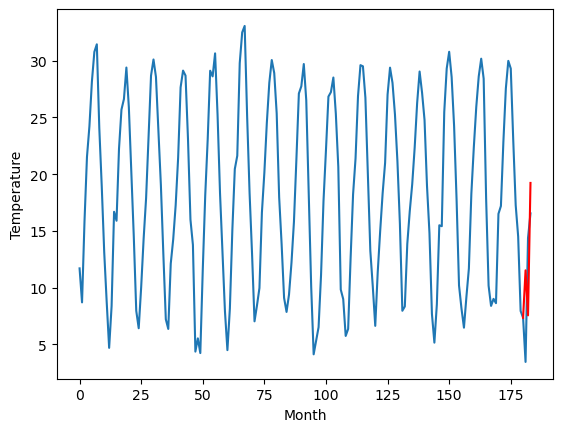

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.59		12.42		1.83
9.02		11.73		2.71
18.27		19.69		1.42
[180, 181, 182, 183]
[6.59, 12.420574488639831, 11.734760525226593, 19.69246602296829]


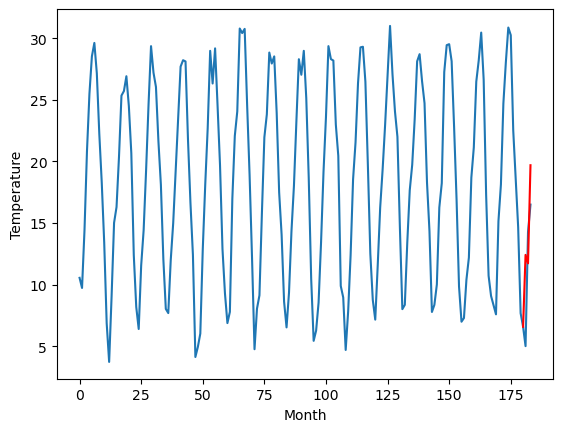

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.79		10.64		-0.15
11.46		11.46		-0.00
17.86		17.91		0.05
[180, 181, 182, 183]
[6.04, 10.635524583458901, 11.45989347755909, 17.907028926014902]


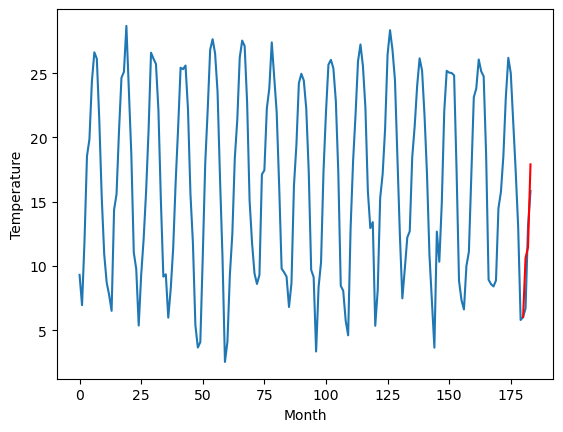

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.65		9.19		1.54
4.04		4.99		0.95
16.31		17.30		0.99
[180, 181, 182, 183]
[3.13, 9.193427391052246, 4.986693210601807, 17.300488300323487]


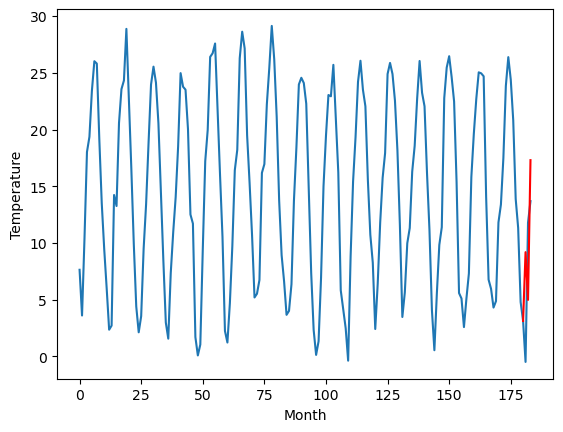

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.06		6.89		0.83
2.70		3.27		0.57
14.67		15.33		0.66
[180, 181, 182, 183]
[-0.29, 6.888742222785949, 3.2700414800643918, 15.330744757652283]


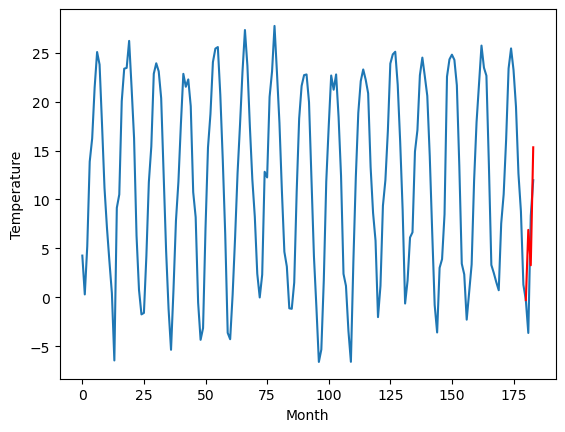

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
2.23		3.67		1.44
-2.21		-1.36		0.85
11.65		12.43		0.78
[180, 181, 182, 183]
[-1.03, 3.6708549952507017, -1.3627644085884096, 12.434291789531708]


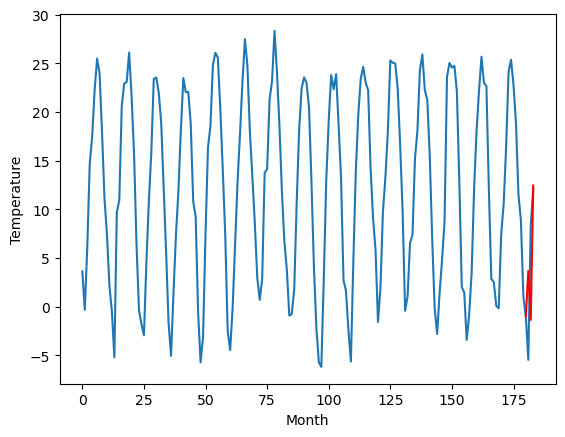

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
1.70		2.49		0.79
-0.54		0.65		1.19
9.35		10.45		1.10
[180, 181, 182, 183]
[-2.29, 2.492196078300476, 0.65392231464386, 10.447149510383607]


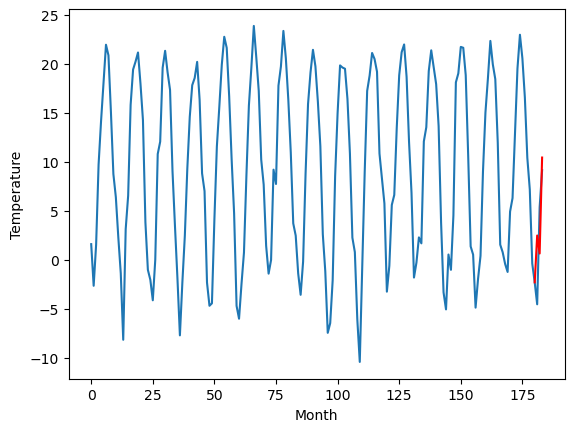

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    2.11   3.384247
1                 1    5.59   5.443809
2                 2   15.41  15.808612
3                 3   10.57  11.667733
4                 4   10.71  11.516926
5                 5   10.59  12.420574
6                 6   10.79  10.635525
7                 7    7.65   9.193427
8                 8    6.06   6.888742
9                 9    2.23   3.670855
10               10    1.70   2.492196


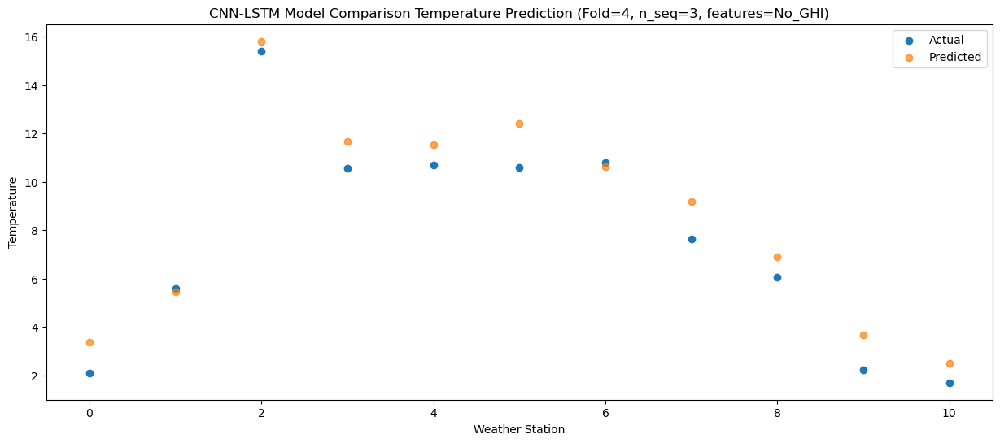

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0   -4.02  -2.108676
1                 1    9.02   6.454544
2                 2   13.49  14.881091
3                 3    7.11   7.726957
4                 4    6.82   7.547204
5                 5    9.02  11.734761
6                 6   11.46  11.459893
7                 7    4.04   4.986693
8                 8    2.70   3.270041
9                 9   -2.21  -1.362764
10               10   -0.54   0.653922


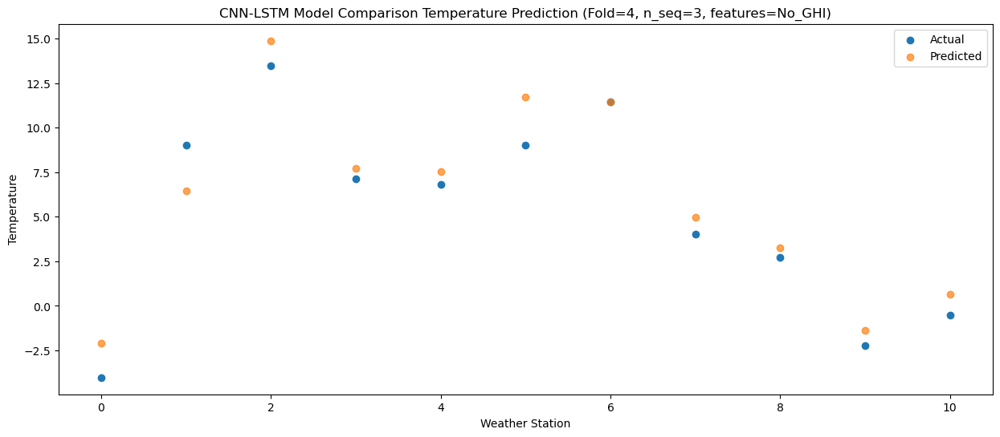

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   10.71  11.995503
1                 1   10.62   9.765661
2                 2   22.82  23.190613
3                 3   18.07  19.393565
4                 4   17.74  19.224431
5                 5   18.27  19.692466
6                 6   17.86  17.907029
7                 7   16.31  17.300488
8                 8   14.67  15.330745
9                 9   11.65  12.434292
10               10    9.35  10.447150


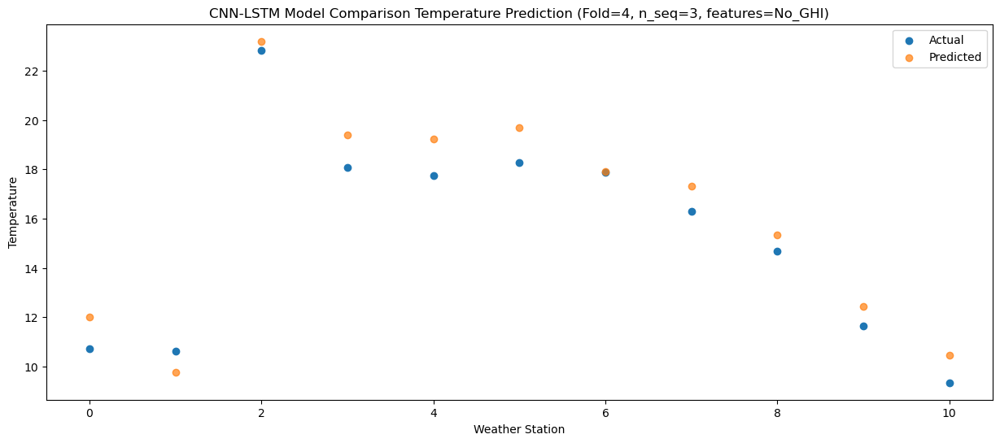

f, t:
[[ 2.11  5.59 15.41 10.57 10.71 10.59 10.79  7.65  6.06  2.23  1.7 ]
 [-4.02  9.02 13.49  7.11  6.82  9.02 11.46  4.04  2.7  -2.21 -0.54]
 [10.71 10.62 22.82 18.07 17.74 18.27 17.86 16.31 14.67 11.65  9.35]]
[[ 3.38424652  5.44380911 15.8086119  11.66773284 11.51692623 12.42057449
  10.63552458  9.19342739  6.88874222  3.670855    2.49219608]
 [-2.10867626  6.45454438 14.88109109  7.72695721  7.54720443 11.73476053
  11.45989348  4.98669321  3.27004148 -1.36276441  0.65392231]
 [11.99550312  9.76566084 23.19061277 19.39356506 19.22443145 19.69246602
  17.90702893 17.3004883  15.33074476 12.43429179 10.44714951]]
Year at t+1:
t+1 SKRMSE: 1.079040
t+1 KRMSE: 1.079040
t+1 MAE: 0.937634
t+1 SKMAPE: 0.224812
t+1 R2_SCORE: 0.935576
t+1 KMAPE: 0.224812
t+1 PEARSON: 0.978825
t+1 AVERAGE ACTUAL: 7.582727
Year at t+2:
t+2 SKRMSE: 1.471353
t+2 KRMSE: 1.471353
t+2 MAE: 1.225890
t+2 SKMAPE: 0.399742
t+2 R2_SCORE: 0.926460
t+2 KMAPE: -0.158401
t+2 PEARSON: 0.946064
t+2 AVERAGE ACTUAL: 5.171818

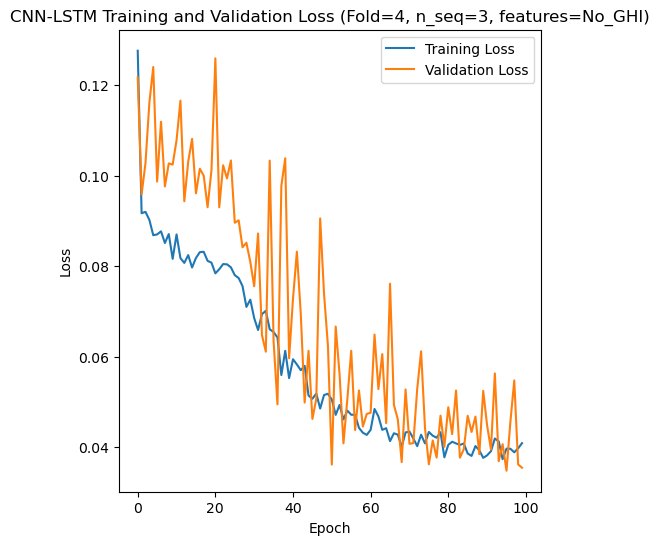

[[1.9935226036700446], [1.607903098147463], [2.7822716402155936], [2.0078310168363718], [1.2105411746102406]]
[[array(1.9935226)], [array(1.6079031)], [array(2.78227164)], [array(2.00783102)], [array(1.21054117)]]
[[1.659085630864808], [1.347567111515638], [2.172758231144962], [1.6059708071353305], [1.0339209574641601]]
[[0.4310283703426793], [0.14362366166470597], [0.2889555689896403], [1.676027320352831], [0.23074720204125074]]
[[0.8704000280365879], [0.8789315326265583], [0.6904662973936416], [0.8676525090639019], [0.9632075927962825]]
[[array(0.10733119)], [array(0.14362366)], [array(0.28895557)], [array(1.60298875)], [array(0.0446996)]]
[[array(0.95900101)], [array(0.95349444)], [array(0.8250993)], [array(0.93986276)], [array(0.97963115)]]
[ 4.43  1.08 12.15 12.87 12.78 17.84 15.34 16.2  22.18  9.    7.43 15.34
 13.35 10.26 20.16 11.52 12.17 17.07 10.21 10.85 17.83  7.91  8.53 15.05
  7.08  2.81 15.28  4.9   2.73 13.48  3.68 -0.63 11.1   8.38  8.6  13.58
 12.   12.66 19.43  8.77  

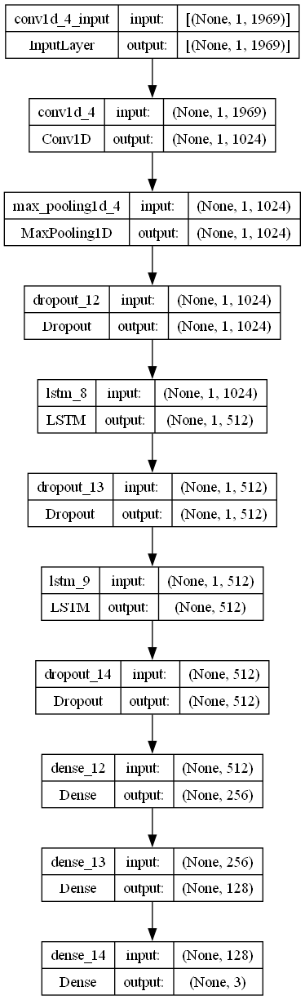

In [2]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def kmape (y_true, y_pred):
    return K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def kpearson (y_true, y_pred):
    mean_true = K.mean(y_true)
    mean_pred = K.mean(y_pred)
    return (K.square(K.mean((y_true - mean_true)*(y_pred - mean_pred))))/(K.mean(K.square(y_true - mean_true))*K.mean(K.square(y_pred - mean_pred)))

# fit the best LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from the best model
    filters = 1024
    lr = 0.0713225001068327
    optimizer = SGD(learning_rate = lr)
    activation_function = 'relu'
    lstm_units = 512
    dropout_rate = 0.16079535852270452

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# Make one forecast with a CNN-LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_cnnlstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_cnnlstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# Evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(actual, forecasts, n_lag, n_seq):

    t = np.array(actual).transpose()
    f = np.array(forecasts).transpose()

    print("f, t:")
    print(t)
    print(f)
    rmse_list = []
    mae_list = []
    skmape_list = []
    mape_list = []
    r2_list = []
    pearson_list = []
    actual_list = []

    for i in range(n_seq):
        act = [row for row in t[i]]
        predicted = [forecast for forecast in f[i]]
        rmse1 = sqrt(mean_squared_error(act, predicted))
        rmse2 = np.array(rmse(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        mae = mean_absolute_error(act, predicted)
        mse = mean_squared_error(act, predicted)
        skmape = mean_absolute_percentage_error(act, predicted)
        kmape1 = np.array(kmape(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        kpearson1 = np.array(kpearson(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        r2 = r2_score(act, predicted) 
        avg_actual = np.mean(act)
        print("Year at t+"+str(i+1)+":")
        print('t+%d SKRMSE: %f' % ((i+1), rmse1))
        print('t+%d KRMSE: %f' % ((i+1), rmse2))        
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d SKMAPE: %f' % ((i+1), skmape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))
        print('t+%d KMAPE: %f' % ((i+1), kmape1))
        print('t+%d PEARSON: %f' % ((i+1), kpearson1))
        print('t+%d AVERAGE ACTUAL: %f' % ((i+1), avg_actual))

    y_true = tf.convert_to_tensor(np.array(actual).flatten())
    y_pred = tf.convert_to_tensor(np.array(forecasts).flatten())

    rmse1 = sqrt(mean_squared_error(np.array(y_true), np.array(y_pred)))
    rmse2 = np.array(rmse(y_true, y_pred))
    mae = mean_absolute_error(np.array(y_true), np.array(y_pred))
    mse = mean_squared_error(np.array(y_true), np.array(y_pred))
    skmape = mean_absolute_percentage_error(np.array(y_true), np.array(y_pred))
    kmape1 = np.array(kmape(y_true, y_pred))
    kpearson1 = np.array(kpearson(y_true, y_pred))
    r2 = r2_score(np.array(y_true), np.array(y_pred)) 
    avg_actual = np.mean(np.array(y_true))
    rmse1_list.append(rmse1)
    rmse2_list.append(rmse2)
    mae_list.append(mae)
    skmape_list.append(skmape)
    pearson_list.append(kpearson1)
    mape_list.append(kmape1)
    r2_list.append(r2)
    actual_list.append(avg_actual)
    print("Metrics for this Fold:")
    print('SKRMSE: %f' % (rmse1))
    print('KRMSE: %f' % (rmse2))        
    print('MAE: %f' % (mae))
    print('SKMAPE: %f' % (skmape))
    print('R2_SCORE: %f' % (r2))
    print('KMAPE: %f' % (kmape1))
    print('PEARSON: %f' % (kpearson1))
    print('AVERAGE ACTUAL: %f' % (avg_actual))

    return rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, actual, n_test, n_seq, n_lag):
    # Plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # Plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Temperature")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse1_avg_list = []
rmse2_avg_list = []
mae_avg_list = []
skmape_avg_list = []
r2_score_avg_list = []
mape_avg_list = []
pearson_avg_list = []
actual_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]
    
    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    print(dataset)

    series = pd.Series(dataset[:, 0]) # Using first column (temperatures)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))
    
    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test, n_seq)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    print(results_df)
    
    print("Actual and Forecasts:")
    print(actual)
    print(forecasts)
    
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        actual_ws = actual[j]
        
        plot_forecasts(series_ws, forecasts_ws, actual_ws, n_test, n_seq, n_lag)

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)

        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='CNN-LSTM Model Comparison Temperature Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No_GHI)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Temperature')
        plt.legend()
        plt.show()

    rmse1_list = [] # list stores sklearn's root mean squared errors for each future time prediction
    rmse2_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores mean absolute errors for each future time prediction
    skmape_list = [] # list stores sklearn's mean squared percentage errors for each future time prediction
    r2_list = [] # list stores sklearn's r2 pearson values for each future time prediction
    mape_list = [] # list stores mean squared percentage errors for each future time prediction
    pearson_list = [] # list stores r2 pearson values for each future time prediction
    actual_list = [] # list stores average actual values for each future time prediction

    # evaluate forecasts
    rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse1_avg_list.append(rmse1_list)
    rmse2_avg_list.append(rmse2_list)
    mae_avg_list.append(mae_list)
    skmape_avg_list.append(skmape_list)
    r2_score_avg_list.append(r2_list)
    mape_avg_list.append(mape_list)
    pearson_avg_list.append(pearson_list)
    actual_avg_list.append(actual_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)
            
    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'CNN-LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No_GHI)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse1_avg_list)
print(rmse2_avg_list)
print(mae_avg_list)
print(skmape_avg_list)
print(r2_score_avg_list)
print(mape_avg_list)
print(pearson_avg_list)
print(np.array(actual_results).flatten())
print(np.array(forecast_results).flatten())
a2 = np.array(actual_results).flatten()
f2 = np.array(forecast_results).flatten()
p1 = np.array(pearson(tf.convert_to_tensor(a2), tf.convert_to_tensor(f2)))
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse1_avg_list)
print("Average SKRMSE:"+str(np.mean(rmse1_avg_list)))
print("Average KRMSE:"+str(np.mean(rmse2_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average SKMAPE:"+str(np.mean(skmape_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average PEARSON:"+str(p1))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "cnnlstm_model_optimized_CV_S3_No_GHI.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)